<a href="https://colab.research.google.com/github/Armaan-Raina/Estrous-Phase-Classification/blob/main/Estrous_Classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Estrous Cycle Phase Classification**

## **Preprocessing/ Feature Extraction**

### **Importing Packages**

In [ ]:
!pip install pyABF efel

In [ ]:
import pyabf
import numpy
import pandas
import matplotlib.pyplot
import os
import glob
import scipy.signal
import scipy
import seaborn
import efel
import sklearn.manifold.TSNE
import sklearn.preprocessing.StandardScaler
import sklearn.model_selection.train_test_split
import sklearn.ensemble.RandomForestClassifier
import sklearn.ensemble.GradientBoostingClassifier
import sklearn.linear_model.LogisticRegression
import sklearn.neighbors.KNeighborsClassifier
import sklearn.neural_network.MLPClassifier
import sklearn.svm.SVC
import sklearn.tree.DecisionTreeClassifier
import sklearn.decomposition.PCA
import sklearn.metrics.accuracy_score
import sklearn.metrics.classification_report
import statsmodels.formula.api
import statsmodels.api
import matplotlib.colors
import pickle
import statsmodels.stats.multicomp.pairwise_tukeyhsd
import networkx as nx
import itertools
from PIL import Image

In [ ]:
!pip freeze > requirements.txt

### **Uploading raw data**

In [ ]:
raw_mEPSC_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus/*.abf')
raw_mEPSC_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus/*.abf')
raw_mEPSC_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus/*.abf')
raw_mEPSC_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus/*.abf')

In [ ]:
raw_spike_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus Spiking/*.abf')
raw_spike_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus Spiking/*.abf')
raw_spike_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus Spiking/*.abf')
raw_spike_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus Spiking/*.abf')

In [ ]:
raw_passive_diestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Diestrus Passive/*.abf')
raw_passive_estrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Estrus Passive/*.abf')
raw_passive_Eproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Early Proestrus Passive/*.abf')
raw_passive_Lproestrus = glob.glob('/content/drive/MyDrive/Estrous Classification Project/Late Proestrus Passive/*.abf')

### **Defining functions for preprocessing**


In [ ]:
def read_abf(filename:str):

    abf = pyabf.ABF(filename)
    time = np.array([], dtype=float)
    current = np.array([], dtype=float)
    sweep_len = abf.sweepX[-1]

    for sweep in range(abf.sweepCount):
        abf.setSweep(sweep)
        current = np.concatenate((current, abf.sweepY))
        time = np.concatenate((time, abf.sweepX + sweep * sweep_len))
    return current #No longer returning time

In [ ]:
def filter_signal(current, freq=20000):

  raw_signal = current
  adjusted_signal = raw_signal - np.median(raw_signal)

  b_lowpass, a_lowpass = signal.bessel(4, 1000, 'low', analog=False, norm='phase', fs=freq)
  b_notch, a_notch = signal.iirnotch(60.0, 30.0, fs=freq)

  b_multiband = signal.convolve(b_lowpass, b_notch)
  a_multiband = signal.convolve(a_lowpass, a_notch)

  filtered_signal = signal.filtfilt(b_multiband, a_multiband, adjusted_signal)

  return filtered_signal

### **Preprocessing for Spiking Data**

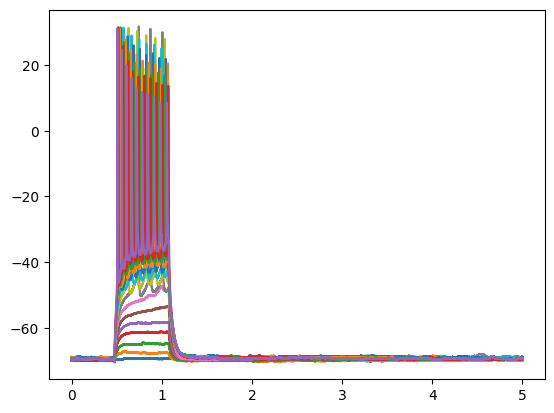

In [ ]:
abf = pyabf.ABF(raw_spike_diestrus[0])
for sweep in abf.sweepList:
  abf.setSweep(sweep)
  plt.plot(abf.sweepX, abf.sweepY)

In [ ]:
#abf -> list of np.ndarrays
clean_diestrus = []
clean_estrus = []
clean_Eproestrus = []
clean_Lproestrus = []

for file in raw_spike_diestrus:
  clean_diestrus.append(read_abf(file))

for file in raw_spike_estrus:
  clean_estrus.append(read_abf(file))

for file in raw_spike_Eproestrus:
  clean_Eproestrus.append(read_abf(file))

for file in raw_spike_Lproestrus:
  clean_Lproestrus.append(read_abf(file))

#### **Following code snippets modified based on implemented from [link text](https://)https://spikesandbursts.wordpress.com/2023/08/24/patch-clamp-data-analysis-in-python-bursts/**

In [ ]:
def spike_detection(sig, fs):
  thresh_min = -25
  thresh_prominence = 15
  thresh_min_width = 0.5 * (fs/1000)
  distance_min = 1 * (fs/1000)

  peaks, peaks_dict = scipy.signal.find_peaks(sig,
            height=thresh_min,
            threshold=thresh_min,
            distance=distance_min,
            prominence=thresh_prominence,
            width=thresh_min_width,
            wlen=None,       # Window length to calculate prominence
            rel_height=0.5,  # Relative height at which the peak width is measured
            plateau_size=None)
  spikes_table = pd.DataFrame(columns = ['spike', 'spike_index', 'spike_time',
                                        'inst_freq', 'isi_s',
                                        'width', 'rise_half_ms', 'decay_half_ms',
                                        'spike_peak', 'spike_amplitude'])

  spikes_table.spike = np.arange(1, len(peaks) + 1)
  spikes_table.spike_index = peaks
  spikes_table.spike_time = peaks / fs  # Divided by fs to get s
  spikes_table.isi_s = np.diff(peaks, axis=0, prepend=peaks[0]) / fs
  spikes_table.inst_freq = 1 / spikes_table.isi_s
  spikes_table.width = peaks_dict['widths']/(fs/1000) # Width (ms) at half-height
  spikes_table.rise_half_ms = (peaks - peaks_dict['left_ips'])/(fs/1000)
  spikes_table.decay_half_ms = (peaks_dict['right_ips'] - peaks)/(fs/1000)
  spikes_table.spike_peak = peaks_dict['peak_heights']  # height parameter is needed
  spikes_table.spike_amplitude = peaks_dict['prominences']  # prominence parameter is needed

  return spikes_table

In [ ]:
abf = pyabf.ABF(raw_spike_diestrus[0])
print(abf.dataPointsPerMs*1000)

In [ ]:
##Testing on one file
df = spike_detection(clean_diestrus[0][1], 20000)

In [ ]:
mod_df = df.drop(["spike",	"spike_index",	"spike_time"], axis=1)

In [ ]:
mod_df = mod_df.replace([-np.inf, np.inf], np.nan).dropna()

In [ ]:
plt.matshow(mod_df.corr())
cb = plt.colorbar()

cb.ax.tick_params(labelsize=14)
plt.title('Correlation Matrix', fontsize=16);

In [ ]:
#Estimating parameters based on diestrus trace
hist_data = mod_df['isi_s']

hist_stats = pd.DataFrame()

bin_size = 10 #ms

isi_range = np.ptp(hist_data)
bins = int((isi_range * 1000 / bin_size) + 0.5)  # Round to the nearest integer
hist = np.histogram(hist_data, bins=bins)
hist_counts = hist[0]
hist_bins = hist[1]

# Cumulative moving average
cum = np.cumsum(hist_counts)  # Cumulative sum
cma = cum / np.arange(1, len(cum) + 1)

# Calculate peaks and valleys of the cma
cma_peaks_indexes = scipy.signal.argrelextrema(cma, np.greater)
cma_valleys_indexes = scipy.signal.argrelextrema(cma, np.less)

# Select the peak you're interested in
peak_index = cma_peaks_indexes[0][0]  # Change second number to select the peak
alpha = cma[peak_index] * 0.5  # Half-peak, adapt the value to your threshold criterion

# Calculate cma_threshold_index relative to the selected cma_peak
cma_threshold = (np.argmin(cma[peak_index:] >= alpha) + peak_index) * bin_size/1000

# Dataframe with histogram statistics
length = len(hist_stats)
hist_stats.loc[length, 'mean_isi'] = np.mean(hist_data)
hist_stats.loc[length, 'median_isi'] = np.median(hist_data)
hist_stats.loc[length, 'kurtosis'] = scipy.stats.kurtosis(hist_counts)
hist_stats.loc[length, 'skewness'] = scipy.stats.skew(hist_counts, bias=True)
hist_stats.loc[length, 'cma_threshold'] = cma_threshold
hist_stats.loc[length, 'cma_valley_time'] = cma_valleys_indexes[0][1] * bin_size/1000  # Change peak index as needed
hist_stats.loc[length, 'cma_peak_time'] = cma_peaks_indexes[0][0] * bin_size/1000  # Change peak index as needed

# Plot ISI histogram
fig, ax = plt.subplots(figsize=(8, 4))
ax.set_title("ISI histogram")
ax.hist(hist_data, bins=bins, alpha=0.6)

# Plot CMA
cma_x = np.linspace(np.min(hist_bins), np.max(hist_bins), bins)
ax.plot(cma_x, cma)

# Plot CMA threshold line
ax.axvline(cma_threshold, linestyle="dotted", color="gray")

# Plot CMA valleys
ax.plot(cma_x[cma_valleys_indexes], cma[cma_valleys_indexes], 'ko')
ax.plot(cma_x[cma_peaks_indexes], cma[cma_peaks_indexes], 'mo')

# ax.set_xscale('log')  # Logarithmic scale may be easier to set the threshold
ax.set_xlabel("Time bins (s)")
ax.set_ylabel("Count")
ax.set_xlim([0,1])

# Show graph and table
plt.show()
hist_stats

In [ ]:
def burst_detection(df, spike_times, spike_amplitudes, spike_peaks, n_spikes, max_isi, min_ibi=None):
    df = df.sort_values(by=spike_times)
    df['burst'] = np.nan
    burst_num = 0
    burst_start = None
    last_spike = None
    for i, row in df.iterrows():  # Loop through DataFrame rows
      spike = row[spike_times]   # Extract the spike position

      if burst_start is None:   # It checks if it is the first spike
          burst_start = spike   # It marks the current spike position as the start of a burst
          last_spike = spike    # Update the last_spike position to the current spike position
          df.at[i, 'burst'] = burst_num   # Assign burst number
      elif spike - last_spike <= max_isi:  # It checks if the current spike is within max isi
          df.at[i, 'burst'] = burst_num
          last_spike = spike
      elif spike - last_spike > min_ibi:  # It checks if the interburst interval has been reached
          burst_num += 1
          burst_start = spike
          last_spike = spike
          df.at[i, 'burst'] = burst_num

      # Filter bursts with less than min_spikes
    df = df[df.groupby('burst')[spike_times].transform('count') >= n_spikes]

    bursts = df.groupby('burst')[spike_times].agg(['min', 'max', 'count'])
    bursts.columns = ['burst_start', 'burst_end', 'spikes_in_bursts']
    bursts['burst_length'] = bursts['burst_end'] - bursts['burst_start']
    bursts['avg_spike_amplitude'] = df.groupby('burst')[spike_amplitudes].mean()
    bursts['avg_spike_peaks'] = df.groupby('burst')[spike_peaks].mean()
    bursts['spikes_frequency'] = bursts['spikes_in_bursts'] / bursts['burst_length']
    bursts = bursts.reset_index()
    bursts['burst_number'] = bursts.index + 1


    return bursts[['burst_number', 'burst_start', 'burst_end',
                  'burst_length', 'spikes_in_bursts', 'avg_spike_amplitude',
                  'avg_spike_peaks', 'spikes_frequency']]


In [ ]:
diestrus_spiking = pd.DataFrame()
estrus_spiking = pd.DataFrame()
Eproestrus_spiking = pd.DataFrame()
Lproestrus_spiking = pd.DataFrame()


for trace in clean_diestrus:
  spikes_table = spike_detection(trace[1], 20000)
  diestrus_spiking = pd.concat([diestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_estrus:
  spikes_table = spike_detection(trace[1], 20000)
  estrus_spiking = pd.concat([estrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_Eproestrus:
  spikes_table = spike_detection(trace[1], 20000)
  Eproestrus_spiking = pd.concat([Eproestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

for trace in clean_Lproestrus:
  spikes_table = spike_detection(trace[1], 20000)
  Lproestrus_spiking = pd.concat([Lproestrus_spiking, burst_detection(spikes_table, 'spike_time', 'spike_amplitude', 'spike_peak', n_spikes = 2, max_isi=0.5, min_ibi=0.1)])

In [ ]:
diestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_spiking_feats")
estrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_spiking_feats")
Eproestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/Earlyproestrus_spiking_feats")
Lproestrus_spiking.to_csv("/content/drive/MyDrive/Estrous Classification Project/Lateproestrus_spiking_feats")

### **Preprocessing for Passive Data**

In [ ]:
#Exploration of abf file to determine constants
abf = pyabf.ABF(raw_passive_Lproestrus[0])
sweeps = abf.sweepList

for sweep in sweeps:
  abf.setSweep(sweep)
  plt.plot(abf.sweepX, abf.sweepC)

abf.setSweep(4)

##Finding the start and end indices of the stimulation
stim_start = 0
stim_end = 0
idx = 0
startFlag = False

val = abf.sweepC

while val[idx] == 0:
  idx+=1
  stim_start += 1

print(stim_start)


for i in range(stim_start, len(val)+1):
  if val[i] == 0:
    stim_end = i
    break

print(stim_end)
print(abf.sweepX[9562])
print(abf.sweepX[stim_end])
plt.plot(abf.sweepX, abf.sweepC)
plt.axvline(0.4781, color='r')
plt.axvline(1.0781, color='g')

print(abf.sweepEpochs)


In [ ]:
##CONSTANTS - determined in last block
stim_start = [4781 / abf.dataRate * 1000]  # ms
stim_end = [10781 / abf.dataRate * 1000]   # ms

ir_current_start = [i for i in range(-140, 10, 10)]
ir_current_stop = 0

curr_start_idx = 4781
curr_stop_idx = 10781

In [ ]:
ir_current_start, abf.dataPointsPerMs * 1000 #20 kHz sampling rate

In [ ]:
def init_features(filename):
    abf = pyabf.ABF(filename)
    sweeps = abf.sweepList

    table = pd.DataFrame(columns=[
        'rmp_mV',
        'steady_state_voltage_mV',
        'vmin_mV',
        'vdeflection_begin_mV',
        'vrebound_mV',
        'voltage_delta_mV',
        'current_pA',
        'input_resistance_Gohm',
        'time_constant_ms',
        'capacitance_pF',
        'sag_amplitude_mV',
        'sag_ratio1',
        'sag_ratio2',
        'sweep',
        'inward_rectification_ratio'
    ])

    inwardRec = []
    inwardRecRatio = np.nan

    for sweep in sweeps:
        abf.setSweep(sweep)

        stim_start_index = 4781
        stim_end_index = 10781
        stim_start = [abf.sweepX[stim_start_index] * 1000]
        stim_end = [abf.sweepX[stim_end_index] * 1000]

        current_pA = np.mean(abf.sweepC[stim_start_index:stim_end_index])

        trace = {
            'T': abf.sweepX * 1000,
            'V': abf.sweepY,
            'stim_start': stim_start,
            'stim_end': stim_end
        }

        feature_values = efel.get_feature_values(
            [trace],
            [
                'voltage_base', 'steady_state_voltage_stimend',
                'minimum_voltage', 'voltage_deflection_begin',
                'voltage_deflection', 'voltage_deflection_vb_ssse',
                'decay_time_constant_after_stim', 'sag_amplitude',
                'sag_ratio1', 'sag_ratio2', 'voltage_after_stim'
            ]
        )[0]

        def safe_get(key, idx=0): #preventing nulls so it can be handled later
            return feature_values[key][idx] if (key in feature_values and feature_values[key] is not None) else np.nan

        base_v = safe_get('voltage_base')
        steady_v = safe_get('steady_state_voltage_stimend')
        vmin = safe_get('minimum_voltage')
        vdeflection_begin = safe_get('voltage_deflection_begin')
        vrebound = safe_get('voltage_after_stim')
        sag_amp = safe_get('sag_amplitude')
        sag_ratio1 = safe_get('sag_ratio1')
        sag_ratio2 = safe_get('sag_ratio2')
        tau = safe_get('decay_time_constant_after_stim')

        delta_v = steady_v - base_v if not np.isnan(steady_v) and not np.isnan(base_v) else np.nan
        Rin = delta_v / current_pA if current_pA != 0 else np.nan
        capacitance = tau / Rin if Rin and not np.isnan(tau) and Rin != 0 else np.nan

        # record specific sweeps for inward rectification ratio
        if sweep == 1:
            inwardRec.append(Rin)
        if sweep == 14:
            inwardRec.append(Rin)

        table.loc[len(table)] = [
            base_v, steady_v, vmin, vdeflection_begin, vrebound, delta_v,
            current_pA, Rin, tau, capacitance, sag_amp, sag_ratio1, sag_ratio2, sweep, np.nan
        ]

    if len(inwardRec) == 2 and not any(np.isnan(inwardRec)):
        inwardRecRatio = inwardRec[1] / inwardRec[0]

    table.iloc[-len(sweeps):, table.columns.get_loc('inward_rectification_ratio')] = inwardRecRatio

    return table

In [ ]:
diestrus_passive_df = pd.DataFrame()
estrus_passive_df = pd.DataFrame()
Eproestrus_passive_df = pd.DataFrame()
Lproestrus_passive_df = pd.DataFrame()

for filename in raw_passive_diestrus:
  df = init_features(filename)
  diestrus_passive_df = pd.concat([df, diestrus_passive_df])

diestrus_passive_df['label'] = 0



for filename in raw_passive_estrus:
  df = init_features(filename)
  estrus_passive_df = pd.concat([df, estrus_passive_df])

estrus_passive_df['label'] = 1

for filename in raw_passive_Eproestrus:
  df = init_features(filename)
  Eproestrus_passive_df = pd.concat([df, Eproestrus_passive_df])

Eproestrus_passive_df['label'] = 2


for filename in raw_passive_Lproestrus:
  df = init_features(filename)
  Lproestrus_passive_df = pd.concat([df, Lproestrus_passive_df])

Lproestrus_passive_df['label'] = 3

In [ ]:
diestrus_passive_df.head(n = 45)

In [ ]:
diestrus_passive_df = diestrus_passive_df.dropna()
estrus_passive_df = estrus_passive_df.dropna()
Eproestrus_passive_df = Eproestrus_passive_df.dropna()
Lproestrus_passive_df = Lproestrus_passive_df.dropna()

In [ ]:
diestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_passive_feats")
estrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_passive_feats")
Eproestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/Eproestrus_passive_feats")
Lproestrus_passive_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/Lproestrus_passive_feats")

## **Feature Loading**



### **mEPSC (MiniAnalysis) Features**

In [ ]:
mEPSC_diestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/diestrus.xlsx')
mEPSC_estrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/estrus.xlsx')
mEPSC_Eproestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/earlyproestrus.xlsx')
mEPSC_Lproestrus = pd.read_excel('/content/drive/MyDrive/Spreadsheets/lateproestrus.xlsx')

In [ ]:
#Filtering out extraneous events likely due to experimental setup or other circumstances
mEPSC_diestrus = mEPSC_diestrus[(mEPSC_diestrus['Amplitude'] < 50) & (mEPSC_diestrus['Baseline'] > 0)]
mEPSC_estrus = mEPSC_estrus[(mEPSC_estrus['Amplitude'] < 50) & (mEPSC_estrus['Baseline'] > 0)]
mEPSC_Eproestrus = mEPSC_Eproestrus[(mEPSC_Eproestrus['Amplitude'] < 50) & (mEPSC_Eproestrus['Baseline'] > 0)]
mEPSC_Lproestrus = mEPSC_Lproestrus[(mEPSC_Lproestrus['Amplitude'] < 50) & (mEPSC_Lproestrus['Baseline'] > 0)]

In [ ]:
def compute_iei(df: pd.DataFrame) -> pd.DataFrame:
    df["Inter-Event Interval (ms)"] = df["Time (ms)"].diff()
    return df

In [ ]:
#Simple IEI computation
mEPSC_diestrus = compute_iei(mEPSC_diestrus)
mEPSC_estrus = compute_iei(mEPSC_estrus)
mEPSC_Eproestrus = compute_iei(mEPSC_Eproestrus)
mEPSC_Lproestrus = compute_iei(mEPSC_Lproestrus)

In [ ]:
mEPSC_diestrus.iloc[0, 18] = mEPSC_diestrus.iloc[0, 1]
mEPSC_estrus.iloc[0, 18] = mEPSC_estrus.iloc[0, 1]
mEPSC_Eproestrus.iloc[0, 18] = mEPSC_Eproestrus.iloc[0, 1]
mEPSC_Lproestrus.iloc[0, 18] = mEPSC_Lproestrus.iloc[0, 1]

In [ ]:
mEPSC_min_count = len(min([mEPSC_diestrus, mEPSC_estrus, mEPSC_Eproestrus, mEPSC_Lproestrus], key=len))

In [ ]:
mEPSC_diestrus['label'] = 0
mEPSC_estrus['label'] = 1
mEPSC_Eproestrus['label'] = 2
mEPSC_Lproestrus['label'] = 3

In [ ]:
mEPSC_diestrus = mEPSC_diestrus.dropna()
mEPSC_estrus = mEPSC_estrus.dropna()
mEPSC_Eproestrus = mEPSC_Eproestrus.dropna()
mEPSC_Lproestrus = mEPSC_Lproestrus.dropna()

In [ ]:
mEPSC = pd.concat([mEPSC_diestrus, mEPSC_estrus, mEPSC_Eproestrus, mEPSC_Lproestrus])

In [ ]:
#Reducing count of each class to match for testing to determine if class imbalance significantly impacts model accuracy
mEPSC_even = pd.concat([mEPSC_diestrus.head(mEPSC_min_count), mEPSC_estrus.head(mEPSC_min_count), mEPSC_Eproestrus.head(mEPSC_min_count), mEPSC_Lproestrus.head(mEPSC_min_count)])

In [ ]:
mEPSC_even.shape

(49344, 20)

In [ ]:
mEPSC_even = mEPSC_even.drop(["Obs Num", "Time (ms)", "Group", "Channel", "Peak Dir", "Burst#", "BurstE#", "Rel Time"], axis=1)

In [ ]:
mEPSC = mEPSC.drop(["Obs Num", "Time (ms)", "Group", "Channel", "Peak Dir", "Burst#", "BurstE#", "Rel Time"], axis=1) #Dropping insignificant features

In [ ]:
mEPSC_names = ["Amplitude",	"Rise (ms)",	"Decay (ms)",	"Area",	"Baseline",	"Noise",	"10-90Rise",	"HalfWidth",	"Rise50",	"10-90Slope", "Inter-Event Interval (ms)"]

### **AP Features**

In [ ]:
spiking_diestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_spiking_feats")
spiking_estrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_spiking_feats")
spiking_Eproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Earlyproestrus_spiking_feats")
spiking_Lproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Lateproestrus_spiking_feats")

In [ ]:
spiking_min_count = len(min([spiking_diestrus, spiking_estrus, spiking_Eproestrus, spiking_Lproestrus], key=len))

In [ ]:
spiking_diestrus.shape, spiking_estrus.shape, spiking_Eproestrus.shape, spiking_Lproestrus.shape

((972, 9), (492, 9), (645, 9), (1964, 9))

In [ ]:
spiking_diestrus['label'] = 0
spiking_estrus['label'] = 1
spiking_Eproestrus['label'] = 2
spiking_Lproestrus['label'] = 3

In [ ]:
spiking = pd.concat([spiking_diestrus, spiking_estrus, spiking_Eproestrus, spiking_Lproestrus])

In [ ]:
spiking = spiking.drop(["Unnamed: 0", "burst_number", "burst_start", "burst_end"], axis=1) #Dropping insignificant features

In [ ]:
spiking_even = pd.concat([spiking_diestrus.head(spiking_min_count), spiking_estrus.head(spiking_min_count), spiking_Eproestrus.head(spiking_min_count), spiking_Lproestrus.head(spiking_min_count)])

In [ ]:
spiking_even = spiking_even.drop(["Unnamed: 0", "burst_number", "burst_start", "burst_end"], axis=1) #Dropping insignificant features

In [ ]:
spiking_names = ["burst_length",	"spikes_in_bursts",	"avg_spike_amplitude",	"avg_spike_peaks",	"spikes_frequency"]

### **Passive Features**


In [ ]:
passive_diestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/diestrus_passive_feats")
passive_estrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/estrus_passive_feats")
passive_Eproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Eproestrus_passive_feats")
passive_Lproestrus = pd.read_csv("/content/drive/MyDrive/Estrous Classification Project/Lproestrus_passive_feats")
#These already have labels saved into them

In [ ]:
passive_min_count = len(min([passive_diestrus, passive_estrus, passive_Eproestrus, passive_Lproestrus], key=len))

In [ ]:
passive = pd.concat([passive_diestrus, passive_estrus, passive_Eproestrus, passive_Lproestrus])

In [ ]:
passive = passive.drop(["Unnamed: 0", "sag_ratio1", "sweep"], axis=1)

In [ ]:
passive_even = pd.concat([passive_diestrus.head(passive_min_count), passive_estrus.head(passive_min_count), passive_Eproestrus.head(passive_min_count), passive_Lproestrus.head(passive_min_count)])

In [ ]:
passive_even = passive_even.drop(["Unnamed: 0", "sag_ratio1", "sweep"], axis=1)

In [ ]:
passive_names = ["rmp_mV",	"steady_state_voltage_mV",	"vmin_mV",	"vdeflection_begin_mV",	"vrebound_mV",	"voltage_delta_mV",	"current_pA",	"input_resistance_Gohm",	"time_constant_ms",	"capacitance_pF",	"sag_amplitude_mV", "sag_ratio1",	"sag_ratio2",	"sweep", "inward_rectification_ratio"]

In [ ]:
passive_names_pretty = ["RMP (mV)",	"Steady State Voltage (mV)",	"Min. Voltage (mV)",	"Voltage Deflection Onset (mV)",	"Rebound Voltage (mV)",	"Voltage Change (mV)",	"Current (pA)",	"Input Resistance (GOhms)",	"time_constant_ms",	"capacitance_pF",	"sag_amplitude_mV","sag_ratio2", "inward_rectification_ratio"]

## **Model Training**

#### **Feature Preparation**

In [ ]:
X_mEPSC = mEPSC.drop('label', axis=1)
y_mEPSC = mEPSC['label']

In [ ]:
X_spiking = spiking.drop('label', axis=1)
y_spiking = spiking['label']

In [ ]:
X_passive = passive.drop('label', axis=1)
y_passive = passive['label']

In [ ]:
X_even_mEPSC = mEPSC_even.drop('label', axis=1)
y_even_mEPSC = mEPSC_even['label']
X_even_spiking = spiking_even.drop('label', axis=1)
y_even_spiking = spiking_even['label']
X_even_passive = passive_even.drop('label', axis=1)
y_even_passive = passive_even['label']

In [ ]:
sc = StandardScaler()
X_mEPSC = sc.fit_transform(X_mEPSC)
X_spiking = sc.fit_transform(X_spiking)
X_passive = sc.fit_transform(X_passive)
X_even_mEPSC = sc.fit_transform(X_even_mEPSC)
X_even_spiking = sc.fit_transform(X_even_spiking)
X_even_passive = sc.fit_transform(X_even_passive)

#### **mEPSC First**

In [ ]:
mEPSC_classification_reports = {}
mEPSC_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

mEPSC_seed_accuracies = {model_name: [] for model_name in [
    'RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC'
]}

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_mEPSC = {name: [] for name in model_names}
all_y_tests_mEPSC = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC, X_test_mEPSC, y_train_mEPSC, y_test_mEPSC = train_test_split(
        X_mEPSC, y_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )

    mEPSC_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_models):
        model.fit(X_train_mEPSC, y_train_mEPSC)
        pred = model.predict(X_test_mEPSC)
        acc = accuracy_score(y_test_mEPSC, pred)
        mEPSC_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC[name].extend(pred)
        all_y_tests_mEPSC[name].extend(y_test_mEPSC)

        # Feature importances for each seed of the RFC
        if name == 'RFC':
            mEPSC_feature_importances[seed] = model.feature_importances_


# Average across seeds
mEPSC_accuracies = [np.mean(mEPSC_seed_accuracies[name]) for name in model_names]
mEPSC_std = [np.std(mEPSC_seed_accuracies[name]) for name in model_names]
for name in model_names:
    if name in all_preds_mEPSC and name in all_y_tests_mEPSC:
        rep = classification_report(all_y_tests_mEPSC[name], all_preds_mEPSC[name], zero_division=0, output_dict=True)
        mEPSC_classification_reports[name] = rep

#### **Spiking Next**

In [ ]:
spiking_classification_reports = {}
spiking_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]  # Same seeds

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_seed_accuracies = {name: [] for name in model_names}

all_preds_spiking = {name: [] for name in model_names}
all_y_tests_spiking = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking, X_test_spiking, y_train_spiking, y_test_spiking = train_test_split(
        X_spiking, y_spiking, test_size=0.25, shuffle=True, random_state=seed
    )

    spiking_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_models):
        model.fit(X_train_spiking, y_train_spiking)
        pred = model.predict(X_test_spiking)
        acc = accuracy_score(y_test_spiking, pred)
        spiking_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking[name].extend(pred)
        all_y_tests_spiking[name].extend(y_test_spiking)

        if name == 'RFC':
            spiking_feature_importances[seed] = model.feature_importances_

# Average across seeds
spiking_accuracies = [np.mean(spiking_seed_accuracies[name]) for name in model_names]
spiking_std = [np.std(spiking_seed_accuracies[name]) for name in model_names]

for name in model_names:
    if name in all_preds_spiking and name in all_y_tests_spiking:
        rep = classification_report(all_y_tests_spiking[name], all_preds_spiking[name], zero_division=0, output_dict=True)
        spiking_classification_reports[name] = rep

#### **Passive Last**

In [ ]:
passive_classification_reports = {}
passive_feature_importances = {}

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_passive = {name: [] for name in model_names}
all_y_tests_passive = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive, X_test_passive, y_train_passive, y_test_passive = train_test_split(
        X_passive, y_passive, test_size=0.25, shuffle=True, random_state=seed
    )

    passive_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_models):
        model.fit(X_train_passive, y_train_passive)
        pred = model.predict(X_test_passive)
        acc = accuracy_score(y_test_passive, pred)
        passive_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive[name].extend(pred)
        all_y_tests_passive[name].extend(y_test_passive)

        if name == "RFC":
          passive_feature_importances[seed] = model.feature_importances_

# Average across seeds
passive_accuracies = [np.mean(passive_seed_accuracies[name]) for name in model_names]
passive_std = [np.std(passive_seed_accuracies[name]) for name in model_names]

for name in model_names:
    if name in all_preds_passive and name in all_y_tests_passive:
        rep = classification_report(all_y_tests_passive[name], all_preds_passive[name], zero_division=0, output_dict=True)
        passive_classification_reports[name] = rep

#### **Now again, addressing data inequality**

In [ ]:
###mEPSC###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

mEPSC_even_seed_accuracies = {name: [] for name in model_names}

all_preds_mEPSC_even = {name: [] for name in model_names}
all_y_tests_mEPSC_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC_even, X_test_mEPSC_even, y_train_mEPSC_even, y_test_mEPSC_even = train_test_split(
        X_even_mEPSC, y_even_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )

    mEPSC_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_even_models):
        model.fit(X_train_mEPSC_even, y_train_mEPSC_even)
        pred = model.predict(X_test_mEPSC_even)
        acc = accuracy_score(y_test_mEPSC_even, pred)
        mEPSC_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC_even[name].extend(pred)
        all_y_tests_mEPSC_even[name].extend(y_test_mEPSC_even)

# Average across seeds
mEPSC_even_accuracies = [np.mean(mEPSC_even_seed_accuracies[name]) for name in model_names]
mEPSC_even_std = [np.std(mEPSC_even_seed_accuracies[name]) for name in model_names]

In [ ]:
###Spiking###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_even_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_spiking_even = {name: [] for name in model_names}
all_y_tests_spiking_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking_even, X_test_spiking_even, y_train_spiking_even, y_test_spiking_even = train_test_split(
        X_even_spiking, y_even_spiking, test_size=0.25, shuffle=True, random_state=seed
    )

    spiking_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_even_models):
        model.fit(X_train_spiking_even, y_train_spiking_even)
        pred = model.predict(X_test_spiking_even)
        acc = accuracy_score(y_test_spiking_even, pred)
        spiking_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking_even[name].extend(pred)
        all_y_tests_spiking_even[name].extend(y_test_spiking_even)

# Average across seeds
spiking_even_accuracies = [np.mean(spiking_even_seed_accuracies[name]) for name in model_names]
spiking_even_std = [np.std(spiking_even_seed_accuracies[name]) for name in model_names]

In [ ]:
###Passive###
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_even_seed_accuracies = {name: [] for name in model_names}

all_preds_passive_even = {name: [] for name in model_names}
all_y_tests_passive_even = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive_even, X_test_passive_even, y_train_passive_even, y_test_passive_even = train_test_split(
        X_even_passive, y_even_passive, test_size=0.25, shuffle=True, random_state=seed
    )

    passive_even_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_even_models):
        model.fit(X_train_passive_even, y_train_passive_even)
        pred = model.predict(X_test_passive_even)
        acc = accuracy_score(y_test_passive_even, pred)
        passive_even_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive_even[name].extend(pred)
        all_y_tests_passive_even[name].extend(y_test_passive_even)

# Average across seeds
passive_even_accuracies = [np.mean(passive_even_seed_accuracies[name]) for name in model_names]
passive_even_std = [np.std(passive_even_seed_accuracies[name]) for name in model_names]

#### **Once more with randomized labels**

In [ ]:
rng = np.random.default_rng(seed=42)

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

mEPSC_rnd_seed_accuracies = {model_name: [] for model_name in [
    'RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC'
]}

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

all_preds_mEPSC_rnd = {name: [] for name in model_names}
all_y_tests_mEPSC_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_mEPSC, X_test_mEPSC, y_train_mEPSC, y_test_mEPSC = train_test_split(
        X_mEPSC, y_mEPSC, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_mEPSC_rnd = rng.permutation(y_train_mEPSC)

    mEPSC_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, mEPSC_models):
        model.fit(X_train_mEPSC, y_train_mEPSC_rnd)
        pred = model.predict(X_test_mEPSC)
        acc = accuracy_score(y_test_mEPSC, pred)
        mEPSC_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_mEPSC_rnd[name].extend(pred)
        all_y_tests_mEPSC_rnd[name].extend(y_test_mEPSC)

# Average across seeds (accuracy)
mEPSC_rnd_accuracies = [np.mean(mEPSC_rnd_seed_accuracies[name]) for name in model_names]
mEPSC_rnd_std = [np.std(mEPSC_rnd_seed_accuracies[name]) for name in model_names]

In [ ]:
SEEDS = [42, 7, 13, 21, 99]  # Same seeds as mEPSC for consistency

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

spiking_rnd_seed_accuracies = {name: [] for name in model_names}

all_preds_spiking_rnd = {name: [] for name in model_names}
all_y_tests_spiking_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_spiking, X_test_spiking, y_train_spiking, y_test_spiking = train_test_split(
        X_spiking, y_spiking, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_spiking_rnd = rng.permutation(y_train_spiking)
    spiking_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),  # No random_state
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, spiking_models):
        model.fit(X_train_spiking, y_train_spiking_rnd)
        pred = model.predict(X_test_spiking)
        acc = accuracy_score(y_test_spiking, pred)
        spiking_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_spiking_rnd[name].extend(pred)
        all_y_tests_spiking_rnd[name].extend(y_test_spiking)

# Average across seeds
spiking_rnd_accuracies = [np.mean(spiking_rnd_seed_accuracies[name]) for name in model_names]
spiking_rnd_std = [np.std(spiking_rnd_seed_accuracies[name]) for name in model_names]

In [ ]:
SEEDS = [42, 7, 13, 21, 99]

model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

passive_rnd_seed_accuracies = {name: [] for name in model_names}

# Store ALL predictions and true labels for ALL seeds' runs
all_preds_passive_rnd = {name: [] for name in model_names}
all_y_tests_passive_rnd = {name: [] for name in model_names}

for seed in SEEDS:
    X_train_passive, X_test_passive, y_train_passive, y_test_passive = train_test_split(
        X_passive, y_passive, test_size=0.25, shuffle=True, random_state=seed
    )
    y_train_passive_rnd = rng.permutation(y_train_passive)

    passive_models = [
        RandomForestClassifier(random_state=seed),
        GradientBoostingClassifier(random_state=seed),
        LogisticRegression(max_iter=1000, random_state=seed),
        KNeighborsClassifier(),
        MLPClassifier(max_iter=1000, random_state=seed),
        SVC(random_state=seed),
        DecisionTreeClassifier(random_state=seed),
    ]

    for name, model in zip(model_names, passive_models):
        model.fit(X_train_passive, y_train_passive_rnd)
        pred = model.predict(X_test_passive)
        acc = accuracy_score(y_test_passive, pred)
        passive_rnd_seed_accuracies[name].append(acc)

        # Store for all seeds
        all_preds_passive_rnd[name].extend(pred)
        all_y_tests_passive_rnd[name].extend(y_test_passive)

# Average across seeds
passive_rnd_accuracies = [np.mean(passive_rnd_seed_accuracies[name]) for name in model_names]
passive_rnd_std = [np.std(passive_rnd_seed_accuracies[name]) for name in model_names]

#### **Saving Results**

In [ ]:
mEPSC_results = {
    "Accuracies": mEPSC_seed_accuracies,
    "Classification Reports": mEPSC_classification_reports,
    "Feature Importances": mEPSC_feature_importances
}

spiking_results = {
    "Accuracies": spiking_seed_accuracies,
    "Classification Reports": spiking_classification_reports,
    "Feature Importances": spiking_feature_importances
}

passive_results = {
    "Accuracies": passive_seed_accuracies,
    "Classification Reports": passive_classification_reports,
    "Feature Importances": passive_feature_importances
}

mEPSC_even_results = {
    "Accuracies": mEPSC_even_seed_accuracies
}

spiking_even_results = {
    "Accuracies": spiking_even_seed_accuracies
}

passive_even_results = {
    "Accuracies": passive_even_seed_accuracies
}

mEPSC_rnd_results = {
    "Accuracies": mEPSC_rnd_seed_accuracies
}

spiking_rnd_results = {
    "Accuracies": spiking_rnd_seed_accuracies
}

passive_rnd_results = {
    "Accuracies": passive_rnd_seed_accuracies
}

# Define the base path for saving to Google Drive
base_path = "/content/drive/MyDrive/Estrous Classification Project/"

with open(base_path + "mEPSC_results.pkl", "wb") as f:
    pickle.dump(mEPSC_results, f)

with open(base_path + "spiking_results.pkl", "wb") as f:
    pickle.dump(spiking_results, f)

with open(base_path + "passive_results.pkl", "wb") as f:
    pickle.dump(passive_results, f)

with open(base_path + "mEPSC_even_results.pkl", "wb") as f:
    pickle.dump(mEPSC_even_results, f)

with open(base_path + "spiking_even_results.pkl", "wb") as f:
    pickle.dump(spiking_even_results, f)

with open(base_path + "passive_even_results.pkl", "wb") as f:
    pickle.dump(passive_even_results, f)

with open(base_path + "mEPSC_rnd_results.pkl", "wb") as f:
    pickle.dump(mEPSC_rnd_results, f)

with open(base_path + "spiking_rnd_results.pkl", "wb") as f:
    pickle.dump(spiking_rnd_results, f)

with open(base_path + "passive_rnd_results.pkl", "wb") as f:
    pickle.dump(passive_rnd_results, f)


## **Results/Analysis**

### **Loading Model Training Results**

In [ ]:
# Define the base path for loading from Google Drive
base_path = "/content/drive/MyDrive/Estrous Classification Project/"

with open(base_path + "mEPSC_results.pkl", "rb") as f:
    mEPSC_results = pickle.load(f)

with open(base_path + "spiking_results.pkl", "rb") as f:
    spiking_results = pickle.load(f)

with open(base_path + "passive_results.pkl", "rb") as f:
    passive_results = pickle.load(f)

with open(base_path + "mEPSC_even_results.pkl", "rb") as f:
    mEPSC_even_results = pickle.load(f)

with open(base_path + "spiking_even_results.pkl", "rb") as f:
    spiking_even_results = pickle.load(f)

with open(base_path + "passive_even_results.pkl", "rb") as f:
    passive_even_results = pickle.load(f)

with open(base_path + "mEPSC_rnd_results.pkl", "rb") as f:
    mEPSC_rnd_results = pickle.load(f)

with open(base_path + "spiking_rnd_results.pkl", "rb") as f:
    spiking_rnd_results = pickle.load(f)

with open(base_path + "passive_rnd_results.pkl", "rb") as f:
    passive_rnd_results = pickle.load(f)

In [ ]:
mEPSC_seed_accuracies = mEPSC_results["Accuracies"]
mEPSC_classification_reports = mEPSC_results["Classification Reports"]
mEPSC_feature_importances = mEPSC_results["Feature Importances"]

spiking_seed_accuracies = spiking_results["Accuracies"]
spiking_classification_reports = spiking_results["Classification Reports"]
spiking_feature_importances = spiking_results["Feature Importances"]

passive_seed_accuracies = passive_results["Accuracies"]
passive_classification_reports = passive_results["Classification Reports"]
passive_feature_importances = passive_results["Feature Importances"]

mEPSC_even_seed_accuracies = mEPSC_even_results["Accuracies"]

spiking_even_seed_accuracies = spiking_even_results["Accuracies"]

passive_even_seed_accuracies = passive_even_results["Accuracies"]

mEPSC_rnd_seed_accuracies = mEPSC_rnd_results["Accuracies"]

spiking_rnd_seed_accuracies = spiking_rnd_results["Accuracies"]

passive_rnd_seed_accuracies = passive_rnd_results["Accuracies"]

### **Feature Importances**



In [ ]:
seeds = mEPSC_feature_importances.keys()
mEPSC_imp = np.vstack([mEPSC_feature_importances[seed] for seed in seeds])
spiking_imp = np.vstack([spiking_feature_importances[seed] for seed in seeds])
passive_imp = np.vstack([passive_feature_importances[seed] for seed in seeds])

In [ ]:
mEPSC_summary = pd.DataFrame({
    "mean": mEPSC_imp.mean(axis=0),
    "std":  mEPSC_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(mEPSC_imp, columns=mEPSC_names)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=mEPSC_names).sort_values("mean", ascending=False)

passive_summary = pd.DataFrame({
    "mean": passive_imp.mean(axis=0),
    "std":  passive_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(passive_imp, columns=passive_names_pretty)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=passive_names_pretty).sort_values("mean", ascending=False)

spiking_summary = pd.DataFrame({
    "mean": spiking_imp.mean(axis=0),
    "std":  spiking_imp.std(axis=0),
    "top5_freq": (
        pd.DataFrame(spiking_imp, columns=spiking_names)
        .rank(axis=1, ascending=False) <= 5
    ).mean(axis=0).values,
}, index=spiking_names).sort_values("mean", ascending=False)

In [ ]:
mEPSC_importances = mEPSC_summary.head(5)
spiking_importances = spiking_summary.head(5)
passive_importances = passive_summary.head(5)
mEPSC_top5 = mEPSC_importances.index.tolist()
spiking_top5 = spiking_importances.index.tolist()
passive_top5 = passive_importances.index.tolist()

In [ ]:
passive_top5 = ['Input Resistance',
 'Membrane Time Constant (ms)',
 'Rebound Voltage (mV)',
 'Voltage Deflection Onset (mV)',
 'RMP (mV)']

In [ ]:
spiking_top5 = ['Burst Length (ms)',
 'Spike Frequency',
 'Average Spike Amplitude',
 'Average Spike Peaks',
 'Spikes per Burst']

In [ ]:
mEPSC_top5 = ['Baseline',
 'Amplitude',
 'HalfWidth',
 '10-90 Slope',
 'Inter-Event Interval (ms)']

In [ ]:
print("\n" + "="*60)
print("ALL FEATURES BY IMPORTANCE")
print("="*60)

print("\nmEPSC Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(mEPSC_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\nSpiking Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(spiking_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\nPassive Dataset:")
print(f"  {'Rank':<6} {'Feature':<35} {'Importance'}")
print(f"  {'-'*6} {'-'*35} {'-'*10}")
for rank, (name, row) in enumerate(passive_summary.iterrows(), start=1):
    marker = "  " if rank > 5 else "* "
    print(f"  {marker}{rank:<6} {name:<35} {row['mean']:.4f}")

print("\n* = included in plot")
print("="*60)


ALL FEATURES BY IMPORTANCE

mEPSC Dataset:
  Rank   Feature                             Importance
  ------ ----------------------------------- ----------
  * 1      Baseline                            0.2331
  * 2      Amplitude                           0.1111
  * 3      HalfWidth                           0.0911
  * 4      10-90Slope                          0.0860
  * 5      Inter-Event Interval (ms)           0.0829
    6      Area                                0.0818
    7      Decay (ms)                          0.0747
    8      10-90Rise                           0.0672
    9      Rise50                              0.0643
    10     Rise (ms)                           0.0570
    11     Noise                               0.0507

Spiking Dataset:
  Rank   Feature                             Importance
  ------ ----------------------------------- ----------
  * 1      burst_length                        0.3291
  * 2      spikes_frequency                    0.2867
  * 3      a

### **t-SNE**

In [ ]:
palette = 'tab10'

In [ ]:
tSNE_X_mEPSC = mEPSC_even.drop("label", axis=1)
tSNE_y_mEPSC = mEPSC_even["label"]

In [ ]:
tSNE_X_passive = passive_even.drop("label", axis=1)
tSNE_y_passive = passive_even["label"]

In [ ]:
tSNE_X_spiking = spiking_even.drop("label", axis=1)
tSNE_y_spiking = spiking_even["label"]

In [ ]:
# Re-run t-SNE with 3 components for mEPSC data
tSNE_mEPSC_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
mEPSC_results_3d = tSNE_mEPSC_3d.fit_transform(tSNE_X_mEPSC)

mEPSC_tSNE_comp1_3d = mEPSC_results_3d[:,0]
mEPSC_tSNE_comp2_3d = mEPSC_results_3d[:,1]
mEPSC_tSNE_comp3_3d = mEPSC_results_3d[:,2]

In [ ]:
# Re-run t-SNE with 3 components for passive data
tSNE_passive_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
passive_results_3d = tSNE_passive_3d.fit_transform(tSNE_X_passive)

passive_tSNE_comp1_3d = passive_results_3d[:,0]
passive_tSNE_comp2_3d = passive_results_3d[:,1]
passive_tSNE_comp3_3d = passive_results_3d[:,2]

In [ ]:
# Re-run t-SNE with 3 components for spiking data
tSNE_spiking_3d = TSNE(n_components=3, verbose=1, perplexity=25, n_iter=300, random_state=42)
spiking_results_3d = tSNE_spiking_3d.fit_transform(tSNE_X_spiking)

spiking_tSNE_comp1_3d = spiking_results_3d[:,0]
spiking_tSNE_comp2_3d = spiking_results_3d[:,1]
spiking_tSNE_comp3_3d = spiking_results_3d[:,2]


### **Figures**

#### **Model vs Accuracy Figure**


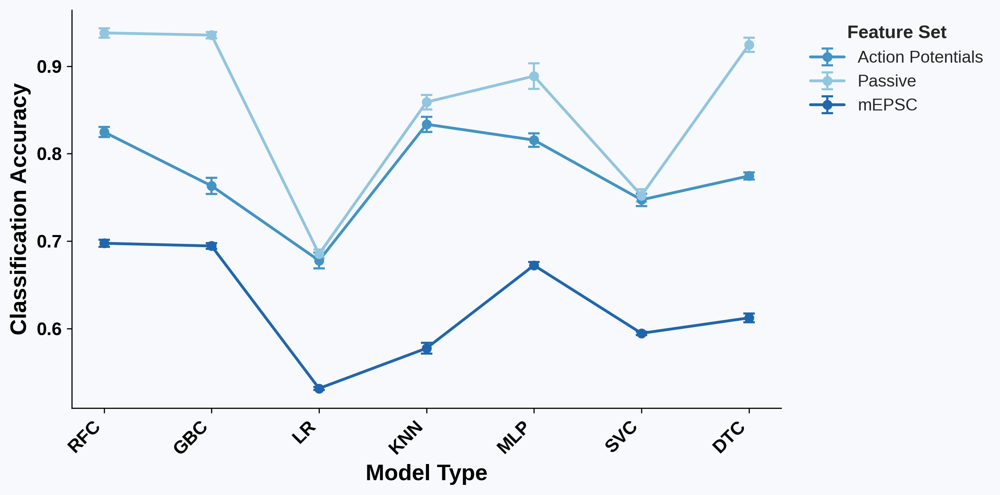

In [ ]:
#POSTER VERSION
plot_colors = {
    "Action Potentials": "#4393c3",
    "Passive": "#92c5de",
    "mEPSC": "#2166ac"
}

model_labels = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

# Narrower width compresses points together; taller height gives more breathing room
fig, ax = plt.subplots(figsize=(10, 5), dpi=300)
plt.style.use('seaborn-v0_8-darkgrid')

# Lighter background
ax.set_facecolor('#f7f9fc')
fig.patch.set_facecolor('#f7f9fc')

datasets = {
    "Action Potentials": (spiking_accuracies, spiking_std),
    "Passive":           (passive_accuracies, passive_std),
    "mEPSC":             (mEPSC_accuracies,   mEPSC_std),
}

for label, (means, stds) in datasets.items():
    ax.errorbar(
        model_labels, means, yerr=stds,
        label=label,
        color=plot_colors[label],
        marker='o',
        linewidth=2.0,
        markersize=6,
        capsize=4,
        capthick=1.5,
        elinewidth=1.5,
    )

ax.set_ylabel("Classification Accuracy", fontsize=16, fontweight='bold')
ax.set_xlabel("Model Type", fontsize=16, fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

plt.xticks(rotation=45, ha='right', fontsize=13, fontweight='bold')
plt.yticks(fontsize=13, fontweight='bold')

legend = ax.legend(
    title="Feature Set",
    fontsize=12,
    title_fontsize=13,
    frameon=False,
    bbox_to_anchor=(1.02, 1.0),
    loc='upper left'
)
# Bold legend title
legend.get_title().set_fontweight('bold')

plt.tight_layout()
plt.show()

In [ ]:
#HELPER FUNCTIONS FOR PAPER VERSION

#Loading stats results for significance markers
tukey_df = pd.read_csv(base_path + 'MC for accuracies.csv', index_col=0)
tukey_df[['feat1','model1']] = tukey_df['group1'].str.split('_', n=1, expand=True)
tukey_df[['feat2','model2']] = tukey_df['group2'].str.split('_', n=1, expand=True)

model_order = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']

def cld_within_feature(feature_set):
    """Compact letters comparing models WITHIN one feature set (for panels B/C/D)"""
    sub = tukey_df[(tukey_df['feat1']==feature_set) & (tukey_df['feat2']==feature_set)]
    G = nx.Graph()
    G.add_nodes_from(model_order)
    for _, row in sub.iterrows():
        if row['reject']:
            G.add_edge(row['model1'], row['model2'])
    coloring = nx.coloring.greedy_color(G, strategy='largest_first')
    colors_sorted = sorted(set(coloring.values()))
    letter_map = {c: chr(97+i) for i, c in enumerate(colors_sorted)}
    return {m: letter_map[coloring[m]] for m in model_order}

def cld_within_model(model):
    """Compact letters comparing feature sets WITHIN one model (for panel A)"""
    sub = tukey_df[(tukey_df['model1']==model) & (tukey_df['model2']==model)]
    G = nx.Graph()
    G.add_nodes_from(['AP','Passive','mEPSC'])
    for _, row in sub.iterrows():
        if row['reject']:
            G.add_edge(row['feat1'], row['feat2'])
    coloring = nx.coloring.greedy_color(G, strategy='largest_first')
    colors_sorted = sorted(set(coloring.values()))
    letter_map = {c: chr(97+i) for i, c in enumerate(colors_sorted)}
    return {f: letter_map[coloring[f]] for f in ['AP','Passive','mEPSC']}

def tukey_row(a, b):
    """Return the Tukey row for groups a,b in either order."""
    r = tuk[((tuk.group1 == a) & (tuk.group2 == b)) |
            ((tuk.group1 == b) & (tuk.group2 == a))]
    if len(r) != 1:
        raise KeyError(f"expected 1 row for {a} vs {b}, got {len(r)}")
    return r.iloc[0]

SIG_LEVELS = [(1e-4, '**'), (0.05, '*')]

def stars(p):
    for thresh, sym in SIG_LEVELS:
        if p < thresh:
            return sym
    return None


def _summarise(d):
    mu = [np.mean(v) * 100 for v in d.values()]
    sd = [np.std(v)  * 100 for v in d.values()]
    return mu, sd

def compact_letters(fs):
    ns = {m: set() for m in model_labels}
    for m1, m2 in itertools.combinations(model_labels, 2):
        if stars(tukey_row(f'{fs}_{m1}', f'{fs}_{m2}')['p-adj']) is None:
            ns[m1].add(m2)
            ns[m2].add(m1)

    order = sorted(model_labels, key=lambda m: -ACC[fs][model_labels.index(m)])
    cliques = []
    for m in order:
        cand = [m] + [x for x in order if x in ns[m]]
        for start in range(len(cand)):
            cl = {cand[start]}
            for x in cand:
                if x in cl:
                    continue
                if all(y in ns[x] for y in cl):
                    cl.add(x)
            if cl not in cliques:
                cliques.append(cl)
    cliques = [c for c in cliques if not any(c < d for d in cliques)]
    cliques.sort(key=lambda c: -max(ACC[fs][model_labels.index(m)] for m in c))

    lab = {m: '' for m in model_labels}
    for letter, c in zip('abcdefghij', cliques):
        for m in c:
            lab[m] += letter
    return lab, cliques


def draw_panel(axis, fs):
    a, e = ACC[fs], STD[fs]
    axis.errorbar(xpos, a, yerr=e, color=plot_colors[SET2COL[fs]], marker='o',
                  linewidth=0, markersize=6, capsize=4, capthick=1.2, elinewidth=1.2)

    for m1, m2 in itertools.combinations(model_labels, 2):
        r = tukey_row(f'{fs}_{m1}', f'{fs}_{m2}')
        audit.append((SET2COL[fs], f'{fs}: {m1} vs {m2}', int(r.csv_line), r.group1,
                      r.group2, r.meandiff, r['p-adj'], stars(r['p-adj']) or 'ns'))

    top = 105
    if ANNOT_MODE == 'cld':
        lab, _ = compact_letters(fs)
        for i, m in enumerate(model_labels):
            axis.text(i, a[i] + e[i] + 2.0, ','.join(lab[m]), ha='center',
                      fontsize=11, fontweight='bold')
        print(f"[{SET2COL[fs]}] CLD: " + ", ".join(
            f"{m}={','.join(lab[m])}" for m in sorted(model_labels,
                                            key=lambda m: -a[model_labels.index(m)])))

    elif ANNOT_MODE == 'brackets':
        sig = []
        for m1, m2 in itertools.combinations(model_labels, 2):
            sym = stars(tukey_row(f'{fs}_{m1}', f'{fs}_{m2}')['p-adj'])
            if sym:
                sig.append((model_labels.index(m1), model_labels.index(m2), sym))
        sig.sort(key=lambda t: abs(t[1] - t[0]))
        y = max(np.array(a) + np.array(e)) + 3
        for i1, i2, sym in sig:
            axis.plot([i1, i1, i2, i2], [y, y + 0.9, y + 0.9, y], color='black', lw=1)
            axis.text((i1 + i2) / 2, y + 1.1, sym, ha='center', fontsize=7)
            y += 3.4
        top = y + 3

    axis.set_ylim(40, top)

#CONSTANTS AND VARIABLES
letters_A = {m: cld_within_model(m) for m in model_order}
letters_AP = cld_within_feature('AP')
letters_Passive = cld_within_feature('Passive')
letters_mEPSC = cld_within_feature('mEPSC')
TUKEY_CSV   = base_path + 'MC for accuracies.csv'
OUT_TIF     = base_path + 'figure3.tif'
ANNOT_MODE  = 'cld'
SHOW_NS_A   = False
LABEL_ALL = True
DPI         = 300
FIGSIZE     = (16, 10)
model_labels = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
feature_sets = ['AP', 'Passive', 'mEPSC']
plot_colors = {"Action Potentials": "#4393c3", "Passive": "#92c5de", "mEPSC": "#2166ac"}
SET2COL = {'AP': "Action Potentials", 'Passive': "Passive", 'mEPSC': "mEPSC"}
ARM_START  = 0.15
LANE_STEP  = 0.26
ARM_LEN    = 0.09
STAR_SIZE  = 12
STAR_PAD   = 0.03
STAR_STACK = True

[Action Potentials] CLD: KNN=a, RFC=a,b, MLP=b, DTC=c, GBC=c,d, SVC=d, LR=e
[Passive] CLD: RFC=a, GBC=a, DTC=a, MLP=b, KNN=c, SVC=d, LR=e
[mEPSC] CLD: RFC=a, GBC=a, MLP=b, DTC=c, SVC=c,d, KNN=d, LR=e
saved /content/drive/MyDrive/Estrous Classification Project/figure3.tif  16x10 in @ 300 dpi


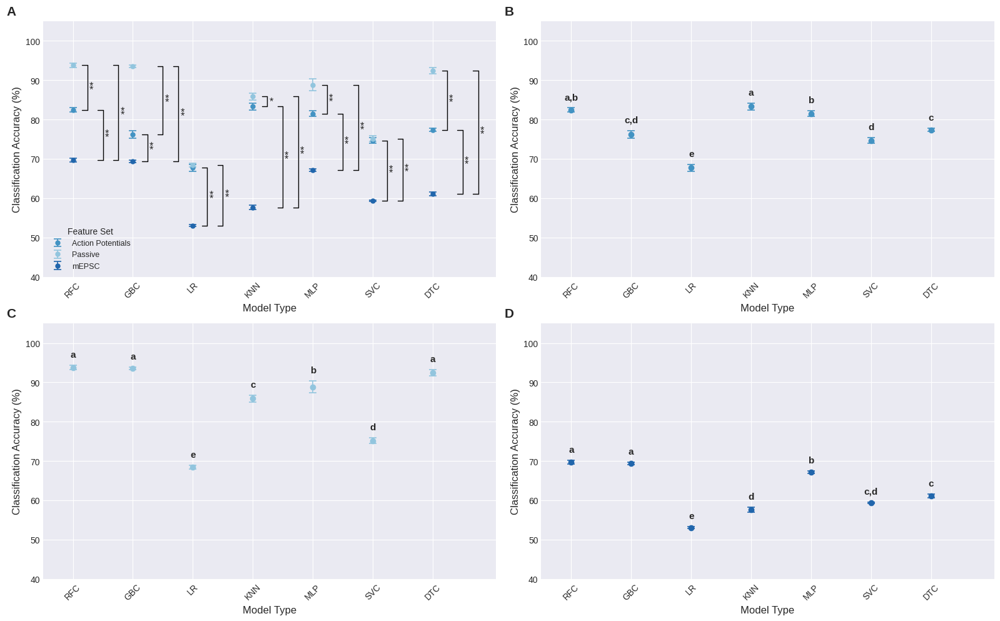

panel              symbol
A                  *          1
                   **        18
                   ns         2
Action Potentials  *          1
                   **        16
                   ns         4
Passive            **        18
                   ns         3
mEPSC              *          2
                   **        16
                   ns         3
dtype: int64


In [ ]:
tuk = pd.read_csv(TUKEY_CSV, index_col=0)
tuk['csv_line'] = tuk.index + 2          # 1-indexed line in the raw file
xpos = np.arange(len(model_labels))
XLIM = (-0.5, len(model_labels) + 0.05)  # same on every panel so columns align


spiking_accuracies, spiking_std = _summarise(spiking_seed_accuracies)
passive_accuracies, passive_std = _summarise(passive_seed_accuracies)
mEPSC_accuracies,   mEPSC_std   = _summarise(mEPSC_seed_accuracies)

ACC = {'AP': spiking_accuracies, 'Passive': passive_accuracies, 'mEPSC': mEPSC_accuracies}
STD = {'AP': spiking_std,        'Passive': passive_std,        'mEPSC': mEPSC_std}

plt.style.use('seaborn-v0_8-darkgrid')
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=FIGSIZE)
audit = []


# ============ PANEL A : within model, across feature sets ============
for fs in feature_sets:
    ax[0, 0].errorbar(xpos, ACC[fs], yerr=STD[fs], label=SET2COL[fs],
                      color=plot_colors[SET2COL[fs]], marker='o', linewidth=0,
                      markersize=5, capsize=4, capthick=1.2, elinewidth=1.2)

for i, m in enumerate(model_labels):
    pairs = []
    for a, b in itertools.combinations(feature_sets, 2):
        r = tukey_row(f'{a}_{m}', f'{b}_{m}')
        sym = stars(r['p-adj'])
        audit.append(('A', f'{m}: {a} vs {b}', int(r.csv_line), r.group1, r.group2,
                      r.meandiff, r['p-adj'], sym or 'ns'))
        if sym is None and not SHOW_NS_A:
            continue
        pairs.append((ACC[a][i], ACC[b][i], sym or 'ns'))

    pairs.sort(key=lambda t: abs(t[0] - t[1]))
    for lane, (y1, y2, sym) in enumerate(pairs):
        x0 = i + ARM_START + lane * LANE_STEP
        x1 = x0 + ARM_LEN
        lo, hi = sorted([y1, y2])
        ax[0, 0].plot([x1, x1], [lo, hi], color='black', lw=1)
        ax[0, 0].plot([x0, x1], [lo, lo], color='black', lw=1)
        ax[0, 0].plot([x0, x1], [hi, hi], color='black', lw=1)
        txt = '\n'.join(sym) if (STAR_STACK and sym != 'ns') else sym
        ax[0, 0].text(x1 + STAR_PAD, (lo + hi) / 2, txt, fontsize=STAR_SIZE,
                      style='italic' if sym == 'ns' else 'normal',
                      va='center', ha='left', linespacing=0.25)

ax[0, 0].set_ylim(40, 105)
ax[0, 0].legend(title="Feature Set", fontsize=9, title_fontsize=10,
                frameon=False, loc='lower left')


draw_panel(ax[0, 1], 'AP')
draw_panel(ax[1, 0], 'Passive')
draw_panel(ax[1, 1], 'mEPSC')


# ============ shared cosmetics ============
uniform_y = len({tuple(a.get_ylim()) for a in ax.ravel()}) == 1

for (row, col), axis in np.ndenumerate(ax):
    axis.set_xticks(xpos)
    axis.set_xlim(*XLIM)
    for sp in ('top', 'right'):
        axis.spines[sp].set_visible(False)

    show_y = LABEL_ALL or col == 0
    show_x = LABEL_ALL or row == 1

    axis.set_ylabel("Classification Accuracy (%)" if show_y else "", fontsize=12)
    if not show_y and uniform_y:
        axis.tick_params(labelleft=False)

    axis.set_xlabel("Model Type" if show_x else "", fontsize=12)
    if show_x:
        axis.set_xticklabels(model_labels, rotation=45)
    else:
        axis.set_xticklabels([])

for axis, letter in zip(ax.ravel(), ['A', 'B', 'C', 'D']):
    axis.text(-0.06, 1.06, letter, transform=axis.transAxes,
              fontsize=15, fontweight='bold', va='top', ha='right')

plt.tight_layout()
fig.subplots_adjust(wspace=0.10, hspace=0.18)

# TIFF export. matplotlib renders RGBA; most journals require flattened RGB,
# so re-open and drop the alpha channel over white.
fig.savefig(OUT_TIF, dpi=DPI, facecolor='white',
            pil_kwargs={'compression': 'tiff_lzw'})
_im = Image.open(OUT_TIF)
if _im.mode != 'RGB':
    _flat = Image.new('RGB', _im.size, 'white')
    _flat.paste(_im, mask=_im.split()[-1] if _im.mode == 'RGBA' else None)
    _flat.save(OUT_TIF, compression='tiff_lzw', dpi=(DPI, DPI))
    _im.close()
plt.show()


# ---------------- audit table for the supplement ----------------
audit_df = pd.DataFrame(audit, columns=['panel', 'comparison', 'csv_line',
                                        'group1', 'group2', 'meandiff',
                                        'p_adj', 'symbol'])
audit_df.to_csv(base_path + 'figure3_significance_audit.csv', index=False)

In [ ]:
#Generated by Claude to assist with organizing MCs into output format for supplementary table S1

SUPP_PREFIX = base_path + 'figure3_supp_'
PP = 100.0


def fmt_p(p):
    """Adjusted p-values hit the solver's numerical floor (~1.9e-14), so anything
    below the reporting threshold is shown as an inequality rather than a
    spuriously precise number."""
    if p < 1e-4:
        return '<0.0001'
    if p < 1e-3:
        return f'{p:.5f}'
    return f'{p:.4f}'


def oriented(g1, g2):
    """Tukey rows store an arbitrary group order. Return diff and CI expressed as
    (mean of g2) - (mean of g1) regardless of how the row is stored."""
    r = tukey_row(g1, g2)
    diff, lo, hi = r.meandiff, r.lower, r.upper
    if r.group1 != g1:                     # row is stored the other way round
        diff, lo, hi = -diff, -hi, -lo     # negate and swap the bounds
    return diff * PP, lo * PP, hi * PP, r['p-adj'], int(r.csv_line)


# ---------------- Table S1: group summary ----------------
letters = {fs: compact_letters(fs)[0] for fs in feature_sets}
_seed_dicts = {'AP': spiking_seed_accuracies,
               'Passive': passive_seed_accuracies,
               'mEPSC': mEPSC_seed_accuracies}

rows_s1 = []
for fs in feature_sets:
    for j, m in enumerate(model_labels):
        rows_s1.append({
            'Feature set': SET2COL[fs],
            'Model': m,
            'Mean accuracy (%)': round(ACC[fs][j], 2),
            'SD (%)': round(STD[fs][j], 2),
            'n (seeds)': len(list(_seed_dicts[fs].values())[j]),
            'Group': ','.join(letters[fs][m]),
        })
table_s1 = pd.DataFrame(rows_s1)


# ---------------- Table S2: pairwise comparisons ----------------
rows_s2 = []

# Panel A -- within model, across feature sets
for m in model_labels:
    for a, b in itertools.combinations(feature_sets, 2):
        d, lo, hi, p, line = oriented(f'{a}_{m}', f'{b}_{m}')
        rows_s2.append({
            'Panel': 'A', 'Stratum': m,
            'Comparison': f'{SET2COL[b]} - {SET2COL[a]}',
            'Difference (pp)': round(d, 2),
            '95% CI': f'[{lo:.2f}, {hi:.2f}]',
            'p-adj': fmt_p(p),
            'Significance': stars(p) or 'n.s.',
            'Source row': line,
        })

# Panels B/C/D -- within feature set, across models
for fs, panel in zip(feature_sets, ['B', 'C', 'D']):
    for m1, m2 in itertools.combinations(model_labels, 2):
        d, lo, hi, p, line = oriented(f'{fs}_{m1}', f'{fs}_{m2}')
        rows_s2.append({
            'Panel': panel, 'Stratum': SET2COL[fs],
            'Comparison': f'{m2} - {m1}',
            'Difference (pp)': round(d, 2),
            '95% CI': f'[{lo:.2f}, {hi:.2f}]',
            'p-adj': fmt_p(p),
            'Significance': stars(p) or 'n.s.',
            'Source row': line,
        })

table_s2 = pd.DataFrame(rows_s2)

# ---------------- sanity checks ----------------
assert len(table_s2) == 21 + 3 * 21, f"expected 84 comparisons, got {len(table_s2)}"
_recon = []
for _, r in table_s2.iterrows():
    lo, hi = [float(v) for v in r['95% CI'].strip('[]').split(',')]
    _recon.append(lo <= r['Difference (pp)'] <= hi)
assert all(_recon), "a difference fell outside its own CI -- check orientation logic"

table_s1.to_csv(SUPP_PREFIX + 'tableS1_group_summary.csv', index=False)
table_s2.to_csv(SUPP_PREFIX + 'tableS2_pairwise_tukey.csv', index=False)

In [ ]:
print("="*10, "Model Accuracies and Standard Deviations", "="*10)

print("="*15, "mEPSC", "="*15)
for model, accuracies in mEPSC_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")

print("="*15, "AP", "="*15)
for model, accuracies in spiking_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")

print("="*15, "Passive", "="*15)
for model, accuracies in passive_seed_accuracies.items():
  mu = np.mean(accuracies)
  sigma = np.std(accuracies)
  print(f"{model}: {mu:.4f} ± {sigma:.4f}")



========== Model Accuracies and Standard Deviations ==========
=============== mEPSC ===============
RFC: 0.6975 ± 0.0040
GBC: 0.6944 ± 0.0031
LR: 0.5315 ± 0.0017
KNN: 0.5775 ± 0.0062
MLP: 0.6723 ± 0.0036
SVC: 0.5945 ± 0.0019
DTC: 0.6122 ± 0.0049
=============== AP ===============
RFC: 0.8247 ± 0.0057
GBC: 0.7631 ± 0.0094
LR: 0.6777 ± 0.0091
KNN: 0.8336 ± 0.0087
MLP: 0.8155 ± 0.0076
SVC: 0.7472 ± 0.0071
DTC: 0.7745 ± 0.0039
=============== Passive ===============
RFC: 0.9381 ± 0.0054
GBC: 0.9355 ± 0.0036
LR: 0.6853 ± 0.0050
KNN: 0.8589 ± 0.0083
MLP: 0.8887 ± 0.0147
SVC: 0.7521 ± 0.0071
DTC: 0.9245 ± 0.0082


#### **Classification Report Figure**

In [ ]:
passive_diestrus_recalls = []
passive_estrus_recalls = []
passive_Eproestrus_recalls = []
passive_Lproestrus_recalls = []
for model_report in passive_classification_reports.values():
  passive_diestrus_recalls.append(model_report['0']['recall'])
  passive_estrus_recalls.append(model_report['1']['recall'])
  passive_Eproestrus_recalls.append(model_report['2']['recall'])
  passive_Lproestrus_recalls.append(model_report['3']['recall'])

spiking_diestrus_recalls = []
spiking_estrus_recalls = []
spiking_Eproestrus_recalls = []
spiking_Lproestrus_recalls = []
for model_report in spiking_classification_reports.values():
  spiking_diestrus_recalls.append(model_report['0']['recall'])
  spiking_estrus_recalls.append(model_report['1']['recall'])
  spiking_Eproestrus_recalls.append(model_report['2']['recall'])
  spiking_Lproestrus_recalls.append(model_report['3']['recall'])

mEPSC_diestrus_recalls = []
mEPSC_estrus_recalls = []
mEPSC_Eproestrus_recalls = []
mEPSC_Lproestrus_recalls = []
for model_report in mEPSC_classification_reports.values():
  mEPSC_diestrus_recalls.append(model_report['0']['recall'])
  mEPSC_estrus_recalls.append(model_report['1']['recall'])
  mEPSC_Eproestrus_recalls.append(model_report['2']['recall'])
  mEPSC_Lproestrus_recalls.append(model_report['3']['recall'])

In [ ]:
print("Passive")
print(f"Diestrus: {np.mean(passive_diestrus_recalls):.4f} +- {np.std(passive_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(passive_estrus_recalls):.4f} +- {np.std(passive_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(passive_Eproestrus_recalls):.4f} +- {np.std(passive_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(passive_Lproestrus_recalls):.4f} +- {np.std(passive_Lproestrus_recalls):.4f}")

print("AP")
print(f"Diestrus: {np.mean(spiking_diestrus_recalls):.4f} +- {np.std(spiking_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(spiking_estrus_recalls):.4f} +- {np.std(spiking_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(spiking_Eproestrus_recalls):.4f} +- {np.std(spiking_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(spiking_Lproestrus_recalls):.4f} +- {np.std(spiking_Lproestrus_recalls):.4f}")

print("mEPSC")
print(f"Diestrus: {np.mean(mEPSC_diestrus_recalls):.4f} +- {np.std(mEPSC_diestrus_recalls):.4f}")
print(f"Estrus: {np.mean(mEPSC_estrus_recalls):.4f} +- {np.std(mEPSC_estrus_recalls):.4f}")
print(f"Early Proestrus: {np.mean(mEPSC_Eproestrus_recalls):.4f} +- {np.std(mEPSC_Eproestrus_recalls):.4f}")
print(f"Late Proestrus: {np.mean(mEPSC_Lproestrus_recalls):.4f} +- {np.std(mEPSC_Lproestrus_recalls):.4f}")

Passive
Diestrus: 0.8957 +- 0.0317
Estrus: 0.6043 +- 0.3266
Early Proestrus: 0.7557 +- 0.1552
Late Proestrus: 0.9992 +- 0.0009
AP
Diestrus: 0.7684 +- 0.0371
Estrus: 0.4361 +- 0.1807
Early Proestrus: 0.5705 +- 0.1391
Late Proestrus: 0.9384 +- 0.0144
mEPSC
Diestrus: 0.5980 +- 0.0819
Estrus: 0.4961 +- 0.1018
Early Proestrus: 0.5995 +- 0.0977
Late Proestrus: 0.8628 +- 0.0399


/tmp/ipykernel_3436/1433464580.py:30: FutureWarning: 

Setting a gradient palette using color= is deprecated and will be removed in v0.14.0. Set `palette='dark:black'` for the same effect.

  sns.pointplot(data=combined_df, x='Dataset', y='Recall', hue='phase',


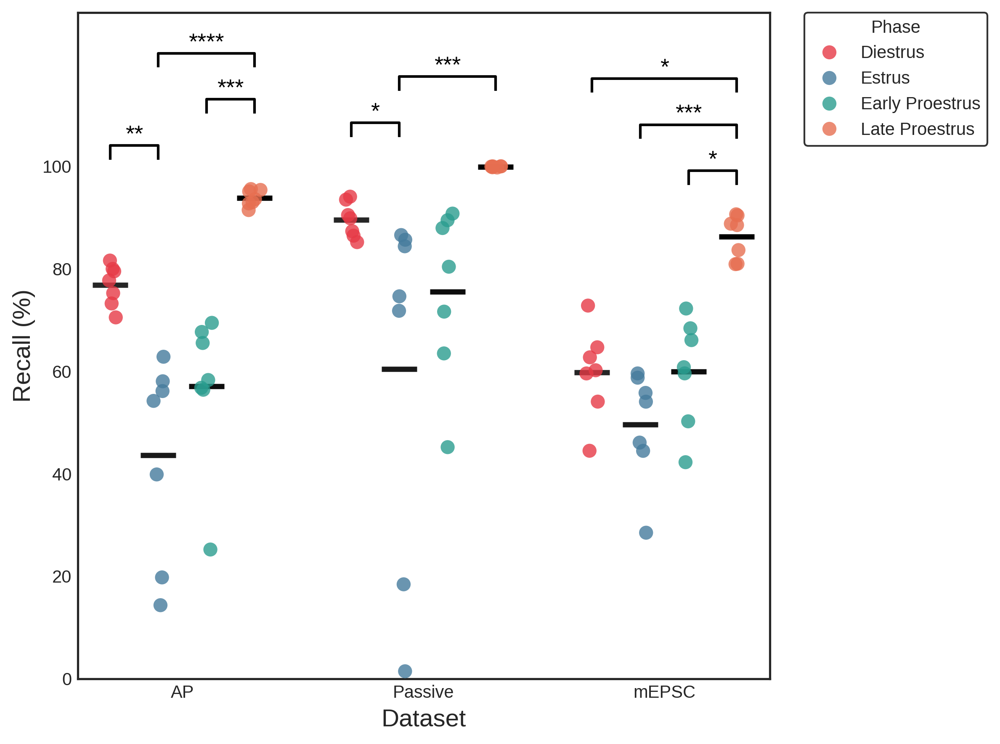

In [ ]:
plt.style.use('seaborn-v0_8-white')
phase_labels = ['Diestrus', 'Estrus', 'Early Proestrus', 'Late Proestrus']

def make_long_df(diestrus, estrus, eproestrus, lproestrus, dataset_name):
    model_names = list(passive_classification_reports.keys())
    rows = []
    for recalls, phase in zip([diestrus, estrus, eproestrus, lproestrus], phase_labels):
        for model, val in zip(model_names, recalls):
            rows.append({'phase': phase, 'Recall': val*100, 'model': model, 'Dataset': dataset_name})
    return pd.DataFrame(rows)

passive_df = make_long_df(passive_diestrus_recalls, passive_estrus_recalls,
                          passive_Eproestrus_recalls, passive_Lproestrus_recalls, 'Passive')
spiking_df = make_long_df(spiking_diestrus_recalls, spiking_estrus_recalls,
                          spiking_Eproestrus_recalls, spiking_Lproestrus_recalls, 'AP')
mEPSC_df   = make_long_df(mEPSC_diestrus_recalls, mEPSC_estrus_recalls,
                          mEPSC_Eproestrus_recalls, mEPSC_Lproestrus_recalls, 'mEPSC')
combined_df = pd.concat([spiking_df, passive_df, mEPSC_df], ignore_index=True)


class_colors = ['#E63946', '#457B9D', '#2A9D8F', '#E76F51']

fig, ax = plt.subplots(figsize=(8, 6), dpi=300)
fig.patch.set_facecolor('white')
ax.set_facecolor('white')

sns.stripplot(data=combined_df, x='Dataset', y='Recall', hue='phase',
              hue_order=phase_labels, dodge=True, size=8, jitter=0.1,
              alpha=0.8, palette=class_colors, ax=ax)
sns.pointplot(data=combined_df, x='Dataset', y='Recall', hue='phase',
              hue_order=phase_labels, dodge=0.8 - 0.8/len(phase_labels),
              estimator='mean', errorbar=None,
              color='black', linestyle='none',
              markers='_', markersize=20, markeredgewidth=3, ax=ax)

handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[:4], labels[:4], title='Phase', bbox_to_anchor=(1.05, 1),
          loc='upper left', frameon=True, edgecolor='black', facecolor='white',
          borderaxespad=0.)


sig_pairs = {
    'AP':      [((0, 1), '**'),  ((2, 3), '***'), ((1, 3), '****')],
    'Passive': [((0, 1), '*'),   ((1, 3), '***')],
    'mEPSC':   [((2, 3), '*'),   ((1, 3), '***'),  ((0, 3), '*')],
}

dataset_order = ['AP', 'Passive', 'mEPSC']
n_hue = len(phase_labels)
hue_offset = {i: -0.4 + (0.8 / n_hue) * (i + 0.5) for i in range(n_hue)}  # -0.3,-0.1,0.1,0.3

tick_h = 2.5
pad    = 6.0
step   = 9.0

for ds, pairs in sig_pairs.items():
    xc = dataset_order.index(ds)
    y_base = combined_df.loc[combined_df['Dataset'] == ds, 'Recall'].max() + pad
    for k, ((a, b), stars) in enumerate(pairs):
        y = y_base + k * step
        x1 = xc + hue_offset[a]
        x2 = xc + hue_offset[b]
        ax.plot([x1, x1, x2, x2], [y, y + tick_h, y + tick_h, y],
                lw=1.5, c='black', solid_capstyle='projecting', clip_on=False)
        ax.text((x1 + x2) / 2, y + tick_h, stars, ha='center', va='bottom',
                color='black', fontsize=13)


ax.set_ylim(0, 130)
ax.set_ylabel("Recall (%)", fontsize=14)
ax.set_xlabel("Dataset", fontsize=14)

fig.subplots_adjust(right=0.75)
plt.tight_layout()

# Explicitly set y-ticks from 0 to 100 even though the graph extends above that for significance bars
custom_yticks = np.arange(0, 101, 20)
ax.set_yticks(custom_yticks)
ax.set_yticklabels([str(int(t)) for t in custom_yticks])

plt.savefig(base_path + 'figure6.tif', bbox_inches='tight')
plt.show()

#### **Feature Importances Figure**

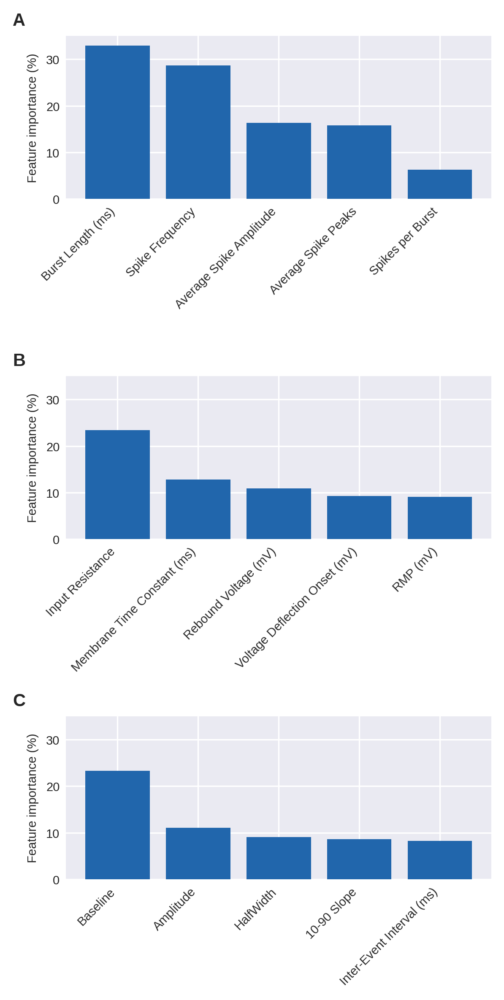

In [ ]:
# Set the plot style and color
plt.style.use('seaborn-v0_8-darkgrid')
plot_color = "#2166ac"

# Create figure with 3 subplots
fig, axes = plt.subplots(3, 1, figsize=(4, 8), dpi=300)

# ============== Panel A: Spiking Dataset ==============


# Top 5 features
axes[0].bar(
    range(5),
    spiking_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[0].set_ylabel("Feature importance (%)", fontsize=7)
axes[0].set_title("A", fontsize=10, fontweight='bold', loc='left', x=-0.125, y=1)
axes[0].set_xticks(range(5))
axes[0].set_xticklabels(spiking_top5, rotation=45, ha='right', fontsize=7)
axes[0].tick_params(axis='y', labelsize=7)
axes[0].spines['top'].set_visible(False)
axes[0].spines['right'].set_visible(False)

# ============== Panel B: Passive Dataset ==============
# Top 5 features
axes[1].bar(
    range(5),
    passive_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[1].set_ylabel("Feature importance (%)", fontsize=7)
axes[1].set_title("B", fontsize=10, fontweight='bold', loc='left',  x=-0.125, y=1)
axes[1].set_xticks(range(5))
axes[1].set_xticklabels(passive_top5, rotation=45, ha='right', fontsize=7)
axes[1].tick_params(axis='y', labelsize=7)
axes[1].spines['top'].set_visible(False)
axes[1].spines['right'].set_visible(False)

# ============== Panel C: mEPSC Dataset ==============
# Top 5 features
axes[2].bar(
    range(5),
    mEPSC_importances["mean"]*100,
    color=plot_color,
    linewidth=0
)

axes[2].set_ylabel("Feature importance (%)", fontsize=7)
axes[2].set_title("C", fontsize=10, fontweight='bold', loc='left',  x=-0.125, y=1)
axes[2].set_xticks(range(5))
axes[2].set_xticklabels(mEPSC_top5, rotation=45, ha='right', fontsize=7)
axes[2].tick_params(axis='y', labelsize=7)
axes[2].spines['top'].set_visible(False)
axes[2].spines['right'].set_visible(False)


# Set the same y-axis limits for all three panels
for ax in axes:
    ax.set_ylim(0, 35)  # Add 5% padding at the top

plt.tight_layout()
plt.savefig(base_path + 'figure4.svg', bbox_inches='tight')
plt.show()


#### **Data Types Figure**

In [ ]:
fig2_X_mEPSC_diestrus = read_abf(raw_mEPSC_diestrus[0])
fig2_X_mEPSC_estrus = read_abf(raw_mEPSC_estrus[0])
fig2_X_mEPSC_Eproestrus = read_abf(raw_mEPSC_Eproestrus[0])
fig2_X_mEPSC_Lproestrus = read_abf(raw_mEPSC_Lproestrus[0])

fig2_X_spike_diestrus = read_abf(raw_spike_diestrus[0])
fig2_X_spike_estrus = read_abf(raw_spike_estrus[0])
fig2_X_spike_Eproestrus = read_abf(raw_spike_Eproestrus[0])
fig2_X_spike_Lproestrus = read_abf(raw_spike_Lproestrus[0])

fig2_X_passive_diestrus = read_abf(raw_passive_diestrus[0])
fig2_X_passive_estrus = read_abf(raw_passive_estrus[0])
fig2_X_passive_Eproestrus = read_abf(raw_passive_Eproestrus[0])
fig2_X_passive_Lproestrus = read_abf(raw_passive_Lproestrus[0])

In [ ]:
abf3 = pyabf.ABF(raw_spike_diestrus[0])
abf3.dataPointsPerMs*1000

20000

In [ ]:
abf = pyabf.ABF(raw_mEPSC_diestrus[0])
abf.dataPointsPerMs*1000


20000

In [ ]:
def filter_signal(current, freq=20000):

  raw_signal = current
  adjusted_signal = raw_signal - np.median(raw_signal)

  b_lowpass, a_lowpass = signal.bessel(4, 800, 'low', analog=False, norm='phase', fs=freq)
  b_notch, a_notch = signal.iirnotch(60.0, 30.0, fs=freq)

  b_multiband = signal.convolve(b_lowpass, b_notch)
  a_multiband = signal.convolve(a_lowpass, a_notch)

  filtered_signal = signal.filtfilt(b_multiband, a_multiband, adjusted_signal)

  return filtered_signal

In [ ]:
filtered = filter_signal(fig2_X_mEPSC_diestrus)

In [ ]:
abf4 = pyabf.ABF(raw_spike_diestrus[0])
x = len(fig2_X_mEPSC_diestrus)/abf4.sweepCount

In [ ]:
sig = fig2_X_spike_diestrus[800000:835000]

In [ ]:
abf2 = pyabf.ABF(raw_passive_diestrus[0])

In [ ]:
len(abf2.sweepX)

100000

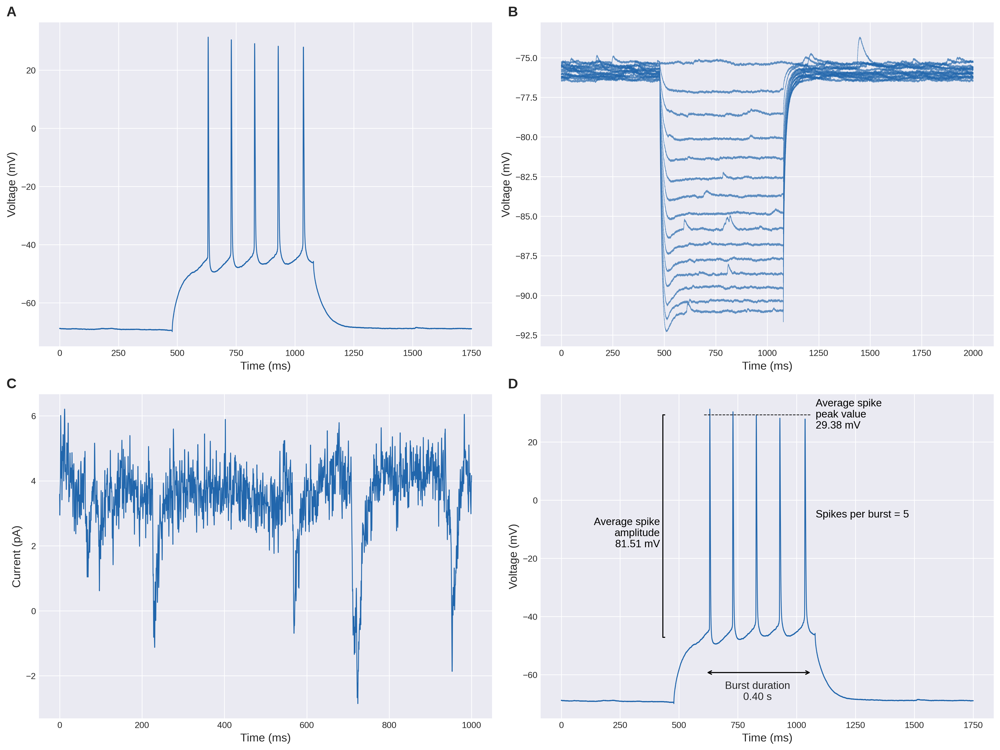

In [ ]:
# Data figure - 3 side by side plots
fig, ax = plt.subplots(nrows=2, ncols=2, figsize=(16, 12), dpi=300) # Changed to 2x2 grid and adjusted figsize

plt.style.use('seaborn-v0_8-darkgrid')

plot_color = "#2166ac"

# Panel A: Spiking plot
spike_data = fig2_X_spike_diestrus[800000:835000]
time_spike = np.arange(len(spike_data)) / abf3.dataPointsPerMs
ax[0,0].plot(time_spike, spike_data, color=plot_color, linewidth=1.0)
ax[0,0].set_ylabel("Voltage (mV)", fontsize=13)
ax[0,0].set_xlabel("Time (ms)", fontsize=13)
ax[0,0].spines['top'].set_visible(False)
ax[0,0].spines['right'].set_visible(False)


# Panel B: Sweep data
for sweep in abf2.sweepList:
    abf2.setSweep(sweep)
    time_sweep = abf2.sweepX[:40000] * 1000
    ax[0,1].plot(time_sweep, abf2.sweepY[:40000], color=plot_color,
               linewidth=0.5, alpha=0.7)
ax[0,1].set_ylabel("Voltage (mV)", fontsize=13)
ax[0,1].set_xlabel("Time (ms)", fontsize=13)
ax[0,1].spines['top'].set_visible(False)
ax[0,1].spines['right'].set_visible(False)

# Panel C: Filtered current
current_data = filtered[235000:255000]
time_current = np.arange(len(current_data)) / abf.dataPointsPerMs
ax[1,0].plot(time_current, current_data, color=plot_color, linewidth=1.0)
ax[1,0].set_ylabel("Current (pA)", fontsize=13)
ax[1,0].set_xlabel("Time (ms)", fontsize=13)
ax[1,0].spines['top'].set_visible(False)
ax[1,0].spines['right'].set_visible(False)

#Panel D: Burst metrics
last_burst = spiking_diestrus.iloc[1]

spike_data = fig2_X_spike_diestrus[800000:835000]
time_spike = np.arange(len(spike_data)) / abf3.dataPointsPerMs

ax[1,1].plot(time_spike, spike_data, color=plot_color, linewidth=1.0)
ax[1,1].set_ylabel("Voltage (mV)", fontsize=13)
ax[1,1].set_xlabel("Time (ms)", fontsize=13)
ax[1,1].spines['top'].set_visible(False)
ax[1,1].spines['right'].set_visible(False)

# --- Panel D annotations ---
burst_start_ms = last_burst['burst_start'] * 1000 - (800000 / abf3.dataPointsPerMs)
burst_end_ms   = last_burst['burst_end']   * 1000 - (800000 / abf3.dataPointsPerMs)

peak_val = last_burst['avg_spike_peaks']                       # 29.38 mV
amp_val  = last_burst['avg_spike_amplitude']                   # 81.51 mV
base_val = peak_val - amp_val                                  # true amplitude foot (~ -52 mV)

# --- 1. Burst duration ---
plateau_val = np.percentile(spike_data, 65)
y_duration = plateau_val

ax[1,1].annotate('', xy=(burst_end_ms + 30, y_duration), xytext=(burst_start_ms - 20, y_duration),
                 arrowprops=dict(arrowstyle='<->', color='black', lw=1.2))
ax[1,1].text((burst_start_ms + burst_end_ms) / 2, y_duration - 3,
             f"Burst duration\n{last_burst['burst_length']:.2f} s",
             ha='center', va='top', fontsize=12)

# --- 2. Avg spike amplitude (bracket now spans peak -> peak - amplitude) ---
bracket_x = burst_start_ms - 200          # sits left of the rise, over flat baseline
tick_width = 8

ax[1,1].plot([bracket_x, bracket_x], [base_val + 5, peak_val], color='black', lw=1.2)
ax[1,1].plot([bracket_x, bracket_x + tick_width], [peak_val, peak_val], color='black', lw=1.2)
ax[1,1].plot([bracket_x, bracket_x + tick_width], [base_val + 5, base_val + 5], color='black', lw=1.2)
ax[1,1].text(bracket_x - 12, (peak_val + base_val) / 2,
             f"Average spike\namplitude\n{amp_val:.2f} mV",
             color='black', fontsize=12, va='center', ha='right')

# --- 3. Avg spike peak value (dashed line only across the spike train) ---
pad = 25
ax[1,1].plot([burst_start_ms - pad, burst_end_ms + pad], [peak_val, peak_val],
             color='black', linestyle='--', linewidth=0.8)
ax[1,1].text(burst_end_ms + pad + 20, peak_val,
             f"Average spike\npeak value\n{peak_val:.2f} mV",
             ha='left', va='center', fontsize=12, color='black')

# --- 4. Spikes per burst ---
ax[1,1].text(burst_end_ms + pad + 20, -5,
             f"Spikes per burst = 5",
             ha='left', va='center', fontsize=12, color='black')

# Add panel labels
for i, label in enumerate(['A', 'B', 'C', 'D']):
    row = i // 2
    col = i % 2
    ax[row, col].text(-0.05, 1.05, label, transform=ax[row, col].transAxes,
                      fontsize=16, fontweight='bold', va='top', ha='right')

plt.tight_layout()
plt.savefig(base_path + 'figure1.tif', bbox_inches='tight')
plt.show()

#### **t-SNE Figure**

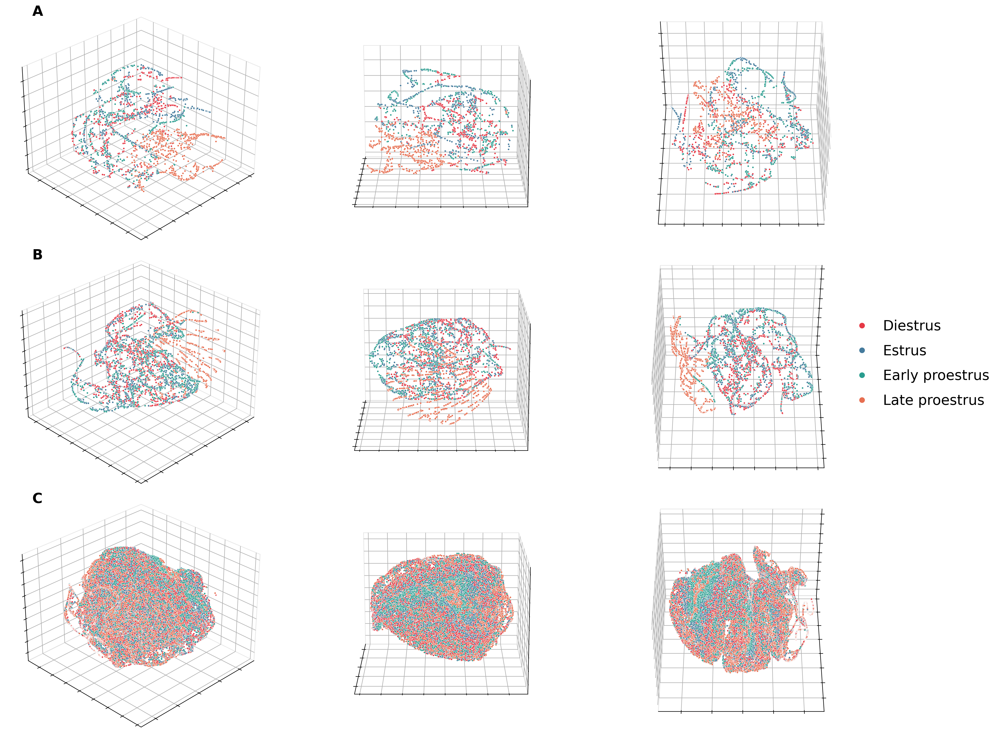

In [ ]:
plt.style.use('default')

views = [(30, 45), (15, 180), (45, 270)]
zoom = 1.2

data_sets = [
    (spiking_tSNE_comp1_3d, spiking_tSNE_comp2_3d, spiking_tSNE_comp3_3d, tSNE_y_spiking),
    (passive_tSNE_comp1_3d, passive_tSNE_comp2_3d, passive_tSNE_comp3_3d, tSNE_y_passive),
    (mEPSC_tSNE_comp1_3d,   mEPSC_tSNE_comp2_3d,   mEPSC_tSNE_comp3_3d, tSNE_y_mEPSC)
]
row_titles = ['A', 'B', 'C']

label_style = {
    (30, 45):  {'x': {'pad': -6, 'size': 9}, 'y': {'pad': -6, 'size': 9}, 'z': {'pad': -10, 'size': 9}},
    (15, 180): {'x': {'pad': -8, 'size': 7}, 'y': {'pad': -2, 'size': 10}, 'z': {'pad': -10, 'size': 9}},
    (45, 270): {'x': {'pad': -6, 'size': 9}, 'y': {'pad': -6, 'size': 9}, 'z': {'pad': -6, 'size': 9}},
}

fig = plt.figure(figsize=(22, 18), dpi=300)
fig.patch.set_facecolor('white')
plt.subplots_adjust(wspace=0.15, hspace=0.15)

scatter = None
class_colors = ['#E63946', '#457B9D', '#2A9D8F', '#E76F51']
cmap = mcolors.ListedColormap(class_colors)

for row, (comp1, comp2, comp3, labels) in enumerate(data_sets):
    for col, (elev, azim) in enumerate(views):
        ax = fig.add_subplot(3, 3, row * 3 + col + 1, projection='3d')
        ax.set_facecolor('white')
        ax.set_box_aspect(None, zoom=zoom)

        scatter = ax.scatter(
            comp1, comp2, comp3,
            c=labels,
            cmap=cmap,
            alpha=1,
            s=6,
            vmin=0, vmax=3,
            edgecolor='w',
            linewidth=0.25
        )

        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_zticklabels([])
        ax.tick_params(axis='both', which='both', length=0)
        ax.view_init(elev=elev, azim=azim)


        ax.xaxis.pane.fill = False
        ax.yaxis.pane.fill = False
        ax.zaxis.pane.fill = False
        ax.xaxis.pane.set_edgecolor('lightgrey')
        ax.yaxis.pane.set_edgecolor('lightgrey')
        ax.zaxis.pane.set_edgecolor('lightgrey')
        ax.grid(True, color='lightgrey', linewidth=0.5)

        if col == 0:
            ax.set_title(row_titles[row], fontsize=20, fontweight='bold', loc='left', pad=2)

legend_labels = ['Diestrus', 'Estrus', 'Early proestrus', 'Late proestrus']
legend_handles = [
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor=c,
               markersize=9, label=l)
    for c, l in zip(class_colors, legend_labels)
]
fig.legend(
    handles=legend_handles,
    labels=legend_labels,
    fontsize=20,
    title_fontsize=0,
    frameon=False,
    loc='center right',
    bbox_to_anchor=(1.02, 0.5),
    handletextpad=0.5,
    labelspacing=0.8,
)

plt.savefig(base_path + 'figure5.svg', bbox_inches='tight')
plt.show()

### **Stats**


#### **AP vs. passive vs. mEPSC accuracies**

In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
all_accuracies_data = []

# Populate with mEPSC seed accuracies (individual values from each seed)
for name in model_names:
    for acc in mEPSC_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "mEPSC",
            "Model": name
        })

# Populate with spiking seed accuracies
for name in model_names:
    for acc in spiking_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "AP",
            "Model": name
        })

# Populate with passive seed accuracies
for name in model_names:
    for acc in passive_seed_accuracies[name]:
        all_accuracies_data.append({
            "Accuracy": acc,
            "Feature_Set": "Passive",
            "Model": name
        })

accuracies_df = pd.DataFrame(all_accuracies_data)

# Drop rows with NaN or inf values in the 'Accuracy' column just in case
accuracies_df = accuracies_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Accuracy'])

formula = "Accuracy ~ C(Feature_Set) * C(Model)"

model = smf.ols(formula, data=accuracies_df).fit()

table = sm.stats.anova_lm(model, typ=2)

display(table)

,sum_sq,df,F,PR(>F)
C(Feature_Set),0.948892,2.0,8146.076465,6.650141e-97
C(Model),0.392074,6.0,1121.962042,5.990581e-78
C(Feature_Set):C(Model),0.113218,12.0,161.992678,1.046640e-52
Residual,0.004892,84.0,NaN,NaN


In [ ]:
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Feature_Set'] + '_' + df_grouped['Model']

tukey = pairwise_tukeyhsd(df_grouped['Accuracy'], df_grouped['group'])

tukey_df = pd.DataFrame(data=tukey._results_table.data[1:],
                         columns=tukey._results_table.data[0])

tukey_df['p-adj'] = tukey.pvalues #To get precise values

pd.set_option('display.float_format', lambda x: f'{x:.12f}')
tukey_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/MC for accuracies.csv")

#### **Across full vs. subsetted dataset**


In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
SEEDS = [42, 7, 13, 21, 99]

# Prepare data for ANOVA
all_accuracies_data = []

# Full dataset accuracies
for model_name in model_names:
    for seed_acc in mEPSC_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Full',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

# Even label count dataset accuracies
for model_name in model_names:
    for seed_acc in mEPSC_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_even_seed_accuracies[model_name]:
        all_accuracies_data.append({
            'Accuracy': seed_acc,
            'Dataset_Type': 'Even_Label',
            'Feature_Set': 'Passive',
            'Model': model_name
        })


accuracies_df = pd.DataFrame(all_accuracies_data)



formula = 'Accuracy ~ C(Dataset_Type) * C(Feature_Set) * C(Model)'

model = smf.ols(formula, data=accuracies_df).fit()
anova_table = sm.stats.anova_lm(model, typ=2) # Type 2 ANOVA for unbalanced designs

print("\nANOVA Results:")
display(anova_table)

DataFrame head for ANOVA:


,Accuracy,Dataset_Type,Feature_Set,Model
0,0.704618,Full,mEPSC,RFC
1,0.693809,Full,mEPSC,RFC
2,0.697019,Full,mEPSC,RFC
3,0.698526,Full,mEPSC,RFC
4,0.693547,Full,mEPSC,RFC



ANOVA Results:


,sum_sq,df,F,PR(>F)
C(Dataset_Type),0.003975,1.0,39.790179,2.414618e-09
C(Feature_Set),1.486087,2.0,7437.010067,1.077114e-164
C(Model),1.102534,6.0,1839.183442,2.145294e-150
C(Dataset_Type):C(Feature_Set),0.070797,2.0,354.297250,5.381277e-61
C(Dataset_Type):C(Model),0.033384,6.0,55.689342,1.867283e-37
C(Feature_Set):C(Model),0.275472,12.0,229.763488,1.822368e-97
C(Dataset_Type):C(Feature_Set):C(Model),0.013533,12.0,11.287746,2.134399e-16
Residual,0.016785,168.0,NaN,NaN


In [ ]:
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Dataset_Type'] + '_' + df_grouped['Feature_Set']

tukey = pairwise_tukeyhsd(df_grouped['Accuracy'], df_grouped['group'])
print(tukey.summary())

            Multiple Comparison of Means - Tukey HSD, FWER=0.05             
      group1             group2       meandiff p-adj   lower   upper  reject
----------------------------------------------------------------------------
Even_Label_Passive Even_Label_Spiking  -0.1221    0.0 -0.1799 -0.0642   True
Even_Label_Passive   Even_Label_mEPSC   -0.183    0.0 -0.2408 -0.1252   True
Even_Label_Passive       Full_Passive   0.0094 0.9972 -0.0484  0.0672  False
Even_Label_Passive       Full_Spiking  -0.0687 0.0097 -0.1265 -0.0109   True
Even_Label_Passive         Full_mEPSC  -0.2196    0.0 -0.2775 -0.1618   True
Even_Label_Spiking   Even_Label_mEPSC   -0.061 0.0321 -0.1188 -0.0032   True
Even_Label_Spiking       Full_Passive   0.1314    0.0  0.0736  0.1893   True
Even_Label_Spiking       Full_Spiking   0.0533 0.0894 -0.0045  0.1111  False
Even_Label_Spiking         Full_mEPSC  -0.0976    0.0 -0.1554 -0.0398   True
  Even_Label_mEPSC       Full_Passive   0.1924    0.0  0.1346  0.2502   True

#### **Across randomized vs. non-randomized**


In [ ]:
model_names = ['RFC', 'GBC', 'LR', 'KNN', 'MLP', 'SVC', 'DTC']
SEEDS = [42, 7, 13, 21, 99]

# Prepare data for ANOVA
all_accuracies_rnd_data = []

# Full dataset accuracies — real labels
for model_name in model_names:
    for seed_acc in mEPSC_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Real',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

# Randomized label control accuracies
for model_name in model_names:
    for seed_acc in mEPSC_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'mEPSC',
            'Model': model_name
        })
    for seed_acc in spiking_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'Spiking',
            'Model': model_name
        })
    for seed_acc in passive_rnd_seed_accuracies[model_name]:
        all_accuracies_rnd_data.append({
            'Accuracy': seed_acc,
            'Label_Type': 'Randomized',
            'Feature_Set': 'Passive',
            'Model': model_name
        })

accuracies_rnd_df = pd.DataFrame(all_accuracies_rnd_data)


formula = 'Accuracy ~ C(Label_Type) * C(Feature_Set) * C(Model)'

rnd_anova_model = smf.ols(formula, data=accuracies_rnd_df).fit()
anova_rnd_table = sm.stats.anova_lm(rnd_anova_model, typ=2)  # Type 2 for unbalanced designs

display(anova_rnd_table)

,sum_sq,df,F,PR(>F)
C(Label_Type),9.544423,1.0,21528.490810,2.881172e-179
C(Feature_Set),0.803411,2.0,906.090375,1.006407e-90
C(Model),0.181837,6.0,68.358813,1.525009e-42
C(Label_Type):C(Feature_Set),0.562475,2.0,634.361957,5.088863e-79
C(Label_Type):C(Model),0.288727,6.0,108.542650,3.672169e-55
C(Feature_Set):C(Model),0.096042,12.0,18.052729,1.491714e-24
C(Label_Type):C(Feature_Set):C(Model),0.078861,12.0,14.823386,7.158673e-21
Residual,0.074481,168.0,NaN,NaN


#### **Across Phase and Feature Set in Classification Reports**


In [ ]:
all_accuracies_data = []

for name in model_names:
  rep = mEPSC_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "mEPSC"
    })
    iter += 1

for name in model_names:
  rep = spiking_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "AP"
    })
    iter += 1

for name in model_names:
  rep = passive_classification_reports[name]
  iter = 0
  for key, value in rep.items():
    if iter > 3:
      break
    all_accuracies_data.append({
        "Recall": value['recall'], #recall
        "Model": name,
        "Phase": key,
        "Feature_Set": "Passive"
    })
    iter += 1

accuracies_df = pd.DataFrame(all_accuracies_data)

accuracies_df = accuracies_df.replace([np.inf, -np.inf], np.nan).dropna(subset=['Recall'])

formula = "Recall ~ C(Phase) * C(Feature_Set) + C(Phase) * C(Model) + C(Feature_Set) * C(Model)"

model = smf.ols(formula, data=accuracies_df).fit()

table = sm.stats.anova_lm(model, typ=2)

display(table)


,sum_sq,df,F,PR(>F)
C(Phase),2.008983,3.0,90.348972,8.075416e-17
C(Feature_Set),0.469982,2.0,31.704358,1.147637e-08
C(Model),0.544055,6.0,12.233745,1.842728e-07
C(Phase):C(Feature_Set),0.148273,6.0,3.334092,1.026852e-02
C(Phase):C(Model),0.511840,18.0,3.836452,2.926833e-04
C(Feature_Set):C(Model),0.172242,12.0,1.936542,6.257390e-02
Residual,0.266830,36.0,NaN,NaN


In [ ]:
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Phase'] + '_' + df_grouped['Feature_Set']

tukey = pairwise_tukeyhsd(df_grouped['Recall'], df_grouped['group'])

tukey_df = pd.DataFrame(data=tukey._results_table.data[1:],
                         columns=tukey._results_table.data[0])

tukey_df['p-adj'] = tukey.pvalues

pd.set_option('display.float_format', lambda x: f'{x:.12f}')
tukey_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/MC for recall.csv")
print(tukey.summary())

   Multiple Comparison of Means - Tukey HSD, FWER=0.05    
  group1    group2  meandiff p-adj   lower   upper  reject
----------------------------------------------------------
     0_AP 0_Passive   0.1273 0.8829 -0.1329  0.3875  False
     0_AP   0_mEPSC  -0.1704 0.5468 -0.4305  0.0898  False
     0_AP      1_AP  -0.3323 0.0027 -0.5924 -0.0721   True
     0_AP 1_Passive  -0.1641 0.6033 -0.4243  0.0961  False
     0_AP   1_mEPSC  -0.2723 0.0322 -0.5325 -0.0121   True
     0_AP      2_AP  -0.1978 0.3167  -0.458  0.0623  False
     0_AP 2_Passive  -0.0127    1.0 -0.2729  0.2475  False
     0_AP   2_mEPSC  -0.1689   0.56 -0.4291  0.0913  False
     0_AP      3_AP   0.1701 0.5495 -0.0901  0.4302  False
     0_AP 3_Passive   0.2309 0.1308 -0.0293   0.491  False
     0_AP   3_mEPSC   0.0944  0.985 -0.1657  0.3546  False
0_Passive   0_mEPSC  -0.2977  0.012 -0.5578 -0.0375   True
0_Passive      1_AP  -0.4596    0.0 -0.7197 -0.1994   True
0_Passive 1_Passive  -0.2914 0.0154 -0.5516 -0.0312   Tr

In [ ]:
df_grouped = accuracies_df.copy()
df_grouped['group'] = df_grouped['Feature_Set'] + '_' + df_grouped['Model']

tukey = pairwise_tukeyhsd(df_grouped['Accuracy'], df_grouped['group'])

tukey_df = pd.DataFrame(data=tukey._results_table.data[1:],
                         columns=tukey._results_table.data[0])

tukey_df['p-adj'] = tukey.pvalues

pd.set_option('display.float_format', lambda x: f'{x:.12f}')
tukey_df.to_csv("/content/drive/MyDrive/Estrous Classification Project/MC for accuracies.csv")